# Test uniformity of HoloAmpAg grating with HD185975 scanning
==================================================================================================

- author : Jérémy Neveu
- date   : May 31st 2017


In [1]:
%%javascript
var kernel = IPython.notebook.kernel;
var thename = window.document.getElementById("notebook_name").innerHTML;
var command = "theNotebook = " + "'"+thename+"'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [2]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

print theNotebook
from IPython.display import Image, display
import sys
sys.path.append("../../common_tools/")
from common_notebook import *

init_notebook()

ScanHoloAmpAg_HD185975
ccdproc version 1.2.0
bottleneck version 1.2.0
/Users/jneveu/Documents/LSST/Calibration/CTIOAnaJun2017/ana_31may17/ScanHoloAmpAg


### Input directory

In [7]:
inputdir="../OverScanRemove/trim_images"
#inputdir="../../data/CTIODataJune2017_reducedRed/data_31may17/"
MIN_IMGNUMBER=116
MAX_IMGNUMBER=140
date = "20170531"
tag = "trim"
holo_name = "HoloAmAg"
object_name='HD185975'
SelectTagRe='^%s_%s_([0-9]+).fits$' % (tag,date) # regular expression to select the file
SearchTagRe='^%s_%s_[0-9]+.fits$' % (tag,date)
NBIMGPERROW=5

### Output directories

In [8]:
dir_top_images="images_notebooks/"+theNotebook ### Top directory to save images
ensure_dir(dir_top_images) # create that directory

outputdir="./cut_fitsimages"
ensure_dir(outputdir)

## Location of the spectra
----------------------------------

In [9]:
dirlist_all = [inputdir]
sorted_numbers,sorted_files = MakeFileList(dirlist_all,MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 

all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

Number of images: 25


### Show images

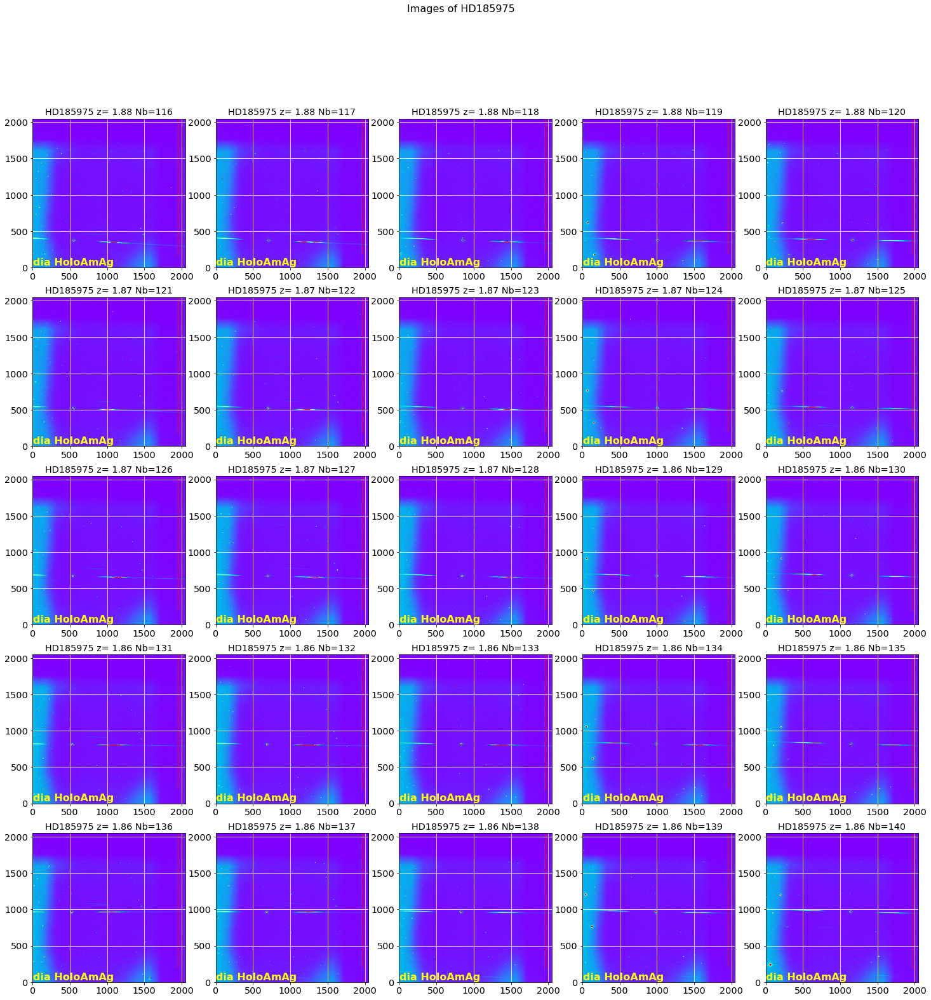

In [11]:
ShowImages(all_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000,downsampling=1,verbose=False)

figfilename=os.path.join(dir_top_images,'input_images.pdf')
plt.savefig(figfilename)   

### Show histograms

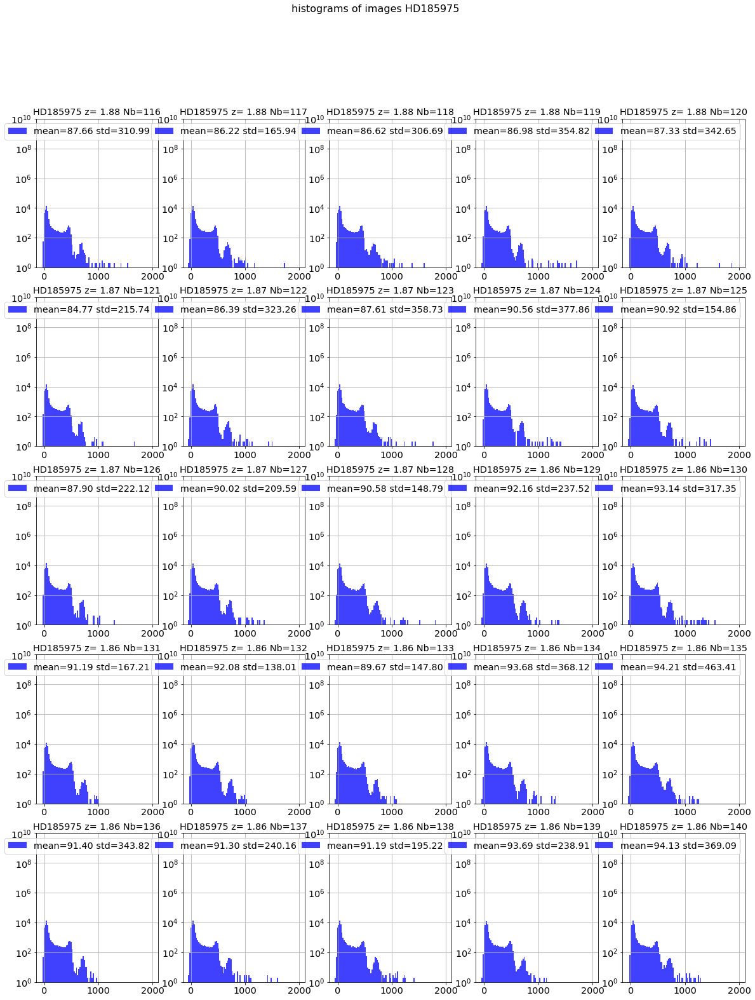

In [12]:
ShowHistograms(all_images,all_titles,all_filt,object_name,
               NBIMGPERROW=5,bins=100,range=(-50,2000),downsampling=10,verbose=False)

### Cut the images

To extract the spectra to analyze

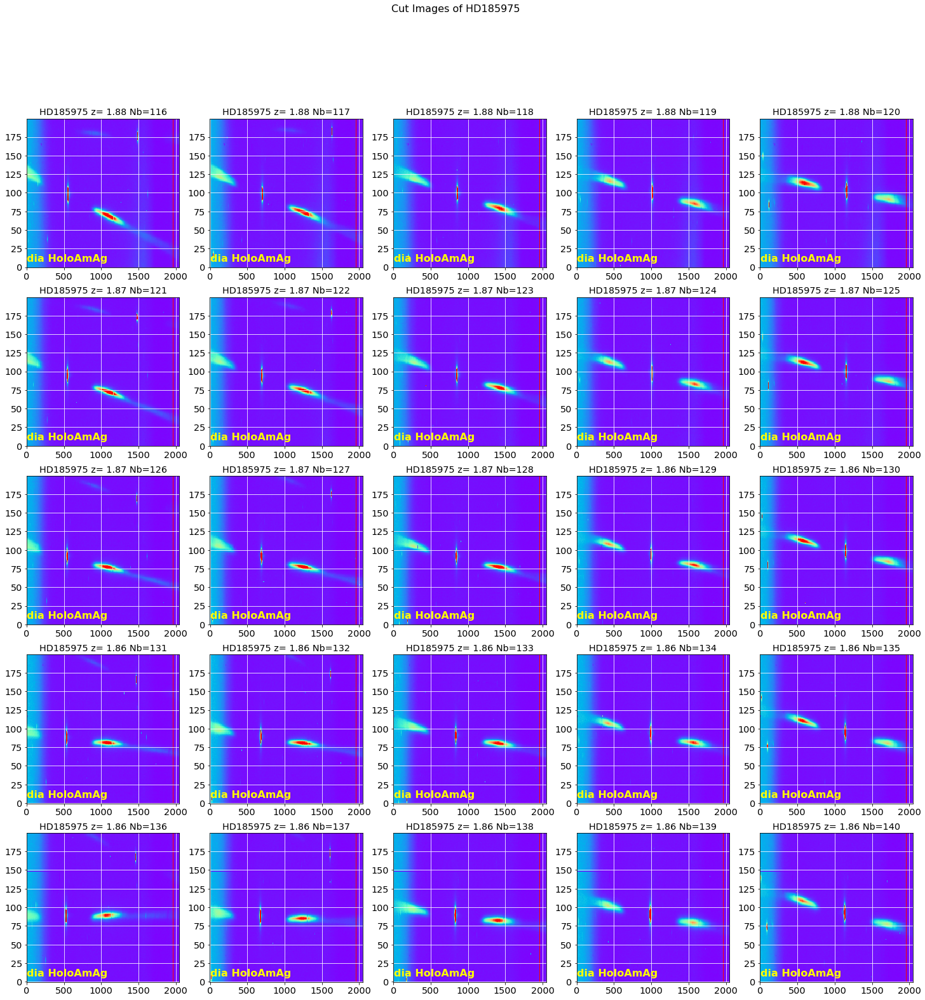

In [18]:
x_guess = [510,  700, 900, 1000, 1100]*5
y_guess = [[375]*5, [525]*5, [675]*5, [825]*5, [975]*5]
y_guess = [val for sublist in y_guess for val in sublist]
DeltaY=[100]*len(all_images)
DeltaX=[2000]*len(all_images)  # must be very large to be able to compute incident angle

images_raw=ShowCenterImages(x_guess,y_guess,DeltaX,DeltaY,all_images,all_titles,all_filt,object_name,
                            NBIMGPERROW=5,vmin=0,vmax=2000)
figfilename=os.path.join(dir_top_images,'cut_images.pdf')
plt.savefig(figfilename)   

### Save cut images

In [19]:
newfullfilenames=[]
for idx,f in np.ndenumerate(sorted_files):
    short_infilename=f.split("/")[-1]
    print short_infilename
    short_partfilename=re.findall('^%s_(.*)' % tag,short_infilename)
    short_outfilename='cutimg_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)
    
for idx,f in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=images_raw[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(f,overwrite=True)

trim_20170531_116.fits
trim_20170531_117.fits
trim_20170531_118.fits
trim_20170531_119.fits
trim_20170531_120.fits
trim_20170531_121.fits
trim_20170531_122.fits
trim_20170531_123.fits
trim_20170531_124.fits
trim_20170531_125.fits
trim_20170531_126.fits
trim_20170531_127.fits
trim_20170531_128.fits
trim_20170531_129.fits
trim_20170531_130.fits
trim_20170531_131.fits
trim_20170531_132.fits
trim_20170531_133.fits
trim_20170531_134.fits
trim_20170531_135.fits
trim_20170531_136.fits
trim_20170531_137.fits
trim_20170531_138.fits
trim_20170531_139.fits
trim_20170531_140.fits


In [20]:
!ls -l cut_fitsimages/*

-rw-r--r--  1 jneveu  staff  3288960 16 aoû 11:08 cut_fitsimages/cutimg_20170531_116.fits
-rw-r--r--  1 jneveu  staff  3288960 16 aoû 11:08 cut_fitsimages/cutimg_20170531_117.fits
-rw-r--r--  1 jneveu  staff  3288960 16 aoû 11:08 cut_fitsimages/cutimg_20170531_118.fits
-rw-r--r--  1 jneveu  staff  3288960 16 aoû 11:08 cut_fitsimages/cutimg_20170531_119.fits
-rw-r--r--  1 jneveu  staff  3288960 16 aoû 11:08 cut_fitsimages/cutimg_20170531_120.fits
-rw-r--r--  1 jneveu  staff  3288960 16 aoû 11:08 cut_fitsimages/cutimg_20170531_121.fits
-rw-r--r--  1 jneveu  staff  3288960 16 aoû 11:08 cut_fitsimages/cutimg_20170531_122.fits
-rw-r--r--  1 jneveu  staff  3288960 16 aoû 11:08 cut_fitsimages/cutimg_20170531_123.fits
-rw-r--r--  1 jneveu  staff  3288960 16 aoû 11:08 cut_fitsimages/cutimg_20170531_124.fits
-rw-r--r--  1 jneveu  staff  3288960 16 aoû 11:08 cut_fitsimages/cutimg_20170531_125.fits
-rw-r--r--  1 jneveu  staff  3288960 16 aoû 11:08 cut_fitsimages/cutimg_20170531_126.fits
-rw-r--r--

# Find the optimal rotation of the spectra
============================

In [21]:
inputdir="./cut_fitsimages"
SelectTagRe='^cutimg_%s_([0-9]+).fits$' % date # regular expression to select the file
SearchTagRe='^cutimg_%s_[0-9]+.fits$' % date

outputdir="./rotated_fitsimages"
ensure_dir(outputdir)

In [22]:
sorted_numbers,sorted_files = MakeFileList([inputdir],MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 

all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

Number of images: 25


## Find rotation by Hessian analysis

La méthode s'inspire des techniques de détection de filmanents dans le milieu interstellaire.
Elle est décrite dans https://arxiv.org/pdf/1409.6728.pdf section 4.1.
Documentation sur le calcul du Hessien : http://scikit-image.org/docs/dev/api/skimage.feature.html#skimage.feature.hessian_matrix

### Test rotation optimal settings

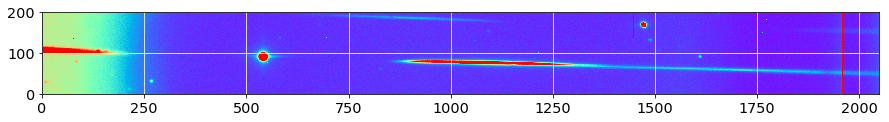

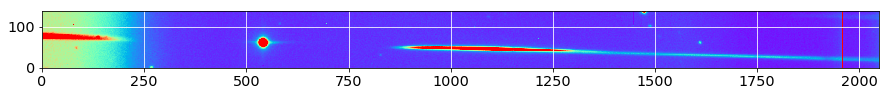

In [25]:
sel=10
image_sel=np.copy(all_images[sel])
y0=DeltaY[sel]
x0=x_guess[sel]

width_cut = 70
right_edge = IMSIZE

plt.imshow(image_sel,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()

region=np.copy(image_sel[y0-width_cut:y0+width_cut,0:right_edge])
data=np.copy(region)
plt.imshow(data,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()

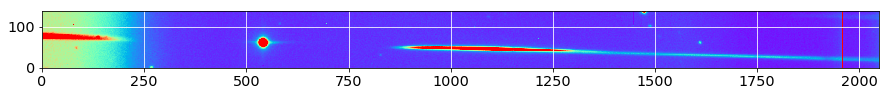

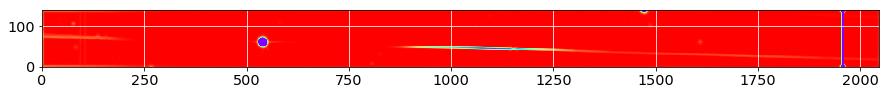

In [26]:
# le paramètre sigma permet de lisser le hessien
Hxx, Hxy, Hyy = hessian_matrix(data, sigma=3, order = 'xy')
lambda_plus = 0.5*( (Hxx+Hyy) + np.sqrt( (Hxx-Hyy)**2 +4*Hxy*Hxy) )
lambda_minus = 0.5*( (Hxx+Hyy) - np.sqrt( (Hxx-Hyy)**2 +4*Hxy*Hxy) )
theta = 0.5*np.arctan2(2*Hxy,Hyy-Hxx)*180/np.pi

margin_cut = 1

lambda_minus = lambda_minus[margin_cut:-margin_cut,margin_cut:-margin_cut]
lambda_plus = lambda_plus[margin_cut:-margin_cut,margin_cut:-margin_cut]
theta = theta[margin_cut:-margin_cut,margin_cut:-margin_cut]

plt.imshow(data,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()
plt.imshow(lambda_minus,origin='lower',cmap='rainbow',vmin=-100,vmax=0)
plt.grid(color='white', ls='solid')
plt.show()

Number of remaining pixels : 3889


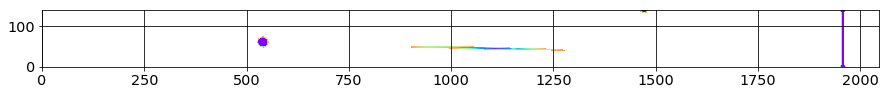

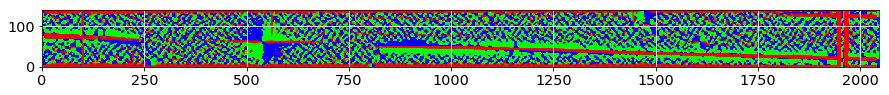

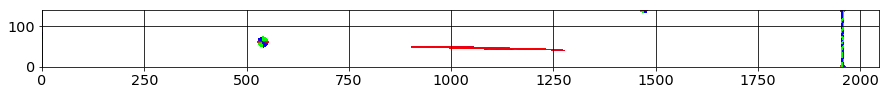

In [29]:
lambda_threshold = -20

mask = np.where(lambda_minus>lambda_threshold)
lambda_mask = np.copy(lambda_minus)
lambda_mask[mask]=np.nan

theta_mask = np.copy(theta)
theta_mask[mask]=np.nan

print 'Number of remaining pixels :',len(lambda_mask[~np.isnan(lambda_mask)])

plt.imshow(lambda_mask,origin='lower',cmap='rainbow',vmin=-100,vmax=0)
plt.grid(color='black', ls='solid')
plt.show()

plt.imshow(theta,origin='lower',cmap=cm.brg,vmin=-30,vmax=30)
plt.grid(color='white', ls='solid')
plt.show()

plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-30,vmax=30)
plt.grid(color='black', ls='solid')
plt.show()

Number of remaining pixels : 2219


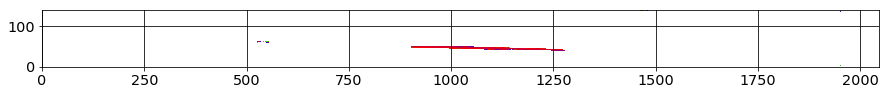

In [30]:
deg_threshold = 8

mask2 = np.where(np.abs(theta)>deg_threshold)
theta_mask[mask2] = np.nan
print 'Number of remaining pixels :',len(theta_mask[~np.isnan(theta_mask)])
plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-deg_threshold,vmax=deg_threshold)
plt.grid(color='black', ls='solid')
plt.show()

Angle median : -1.2476123379


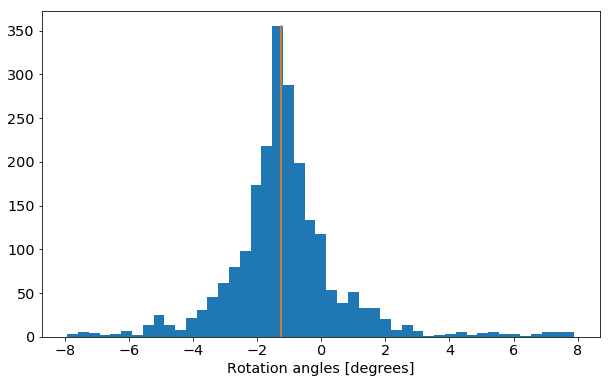

In [31]:
theta_hist = []
theta_hist = theta_mask[~np.isnan(theta_mask)].flatten()
theta_median = np.median(theta_hist)
print 'Angle median :',theta_median
fig = plt.figure(figsize=(10,6))
n,bins, patches = plt.hist(theta_hist,bins=int(np.sqrt(len(theta_hist))))
plt.plot([theta_median,theta_median],[0,np.max(n)])
plt.xlabel("Rotation angles [degrees]")
plt.show()

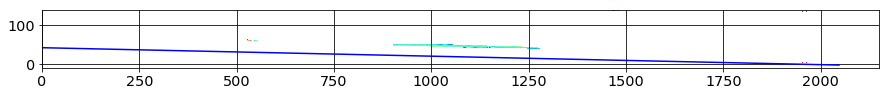

In [32]:
xindex=np.arange(data.shape[1])
x_new = np.linspace(xindex.min(),xindex.max(), 50)
y_new = y0 - width_cut + (x_new-x0)*np.tan(theta_median*np.pi/180.)
plt.imshow(theta_mask,origin='lower',cmap='rainbow',vmin=-deg_threshold,vmax=deg_threshold)
plt.plot(x_new,y_new,'b-')
plt.grid(color='black', ls='solid')
plt.show()

On peut aussi essayer de fitter le spectre qui a été détecté par la méthode ci-dessus.

Rotation angle from fit : 0.371728651749


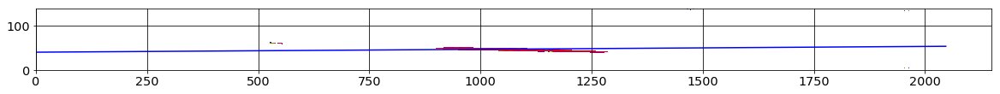

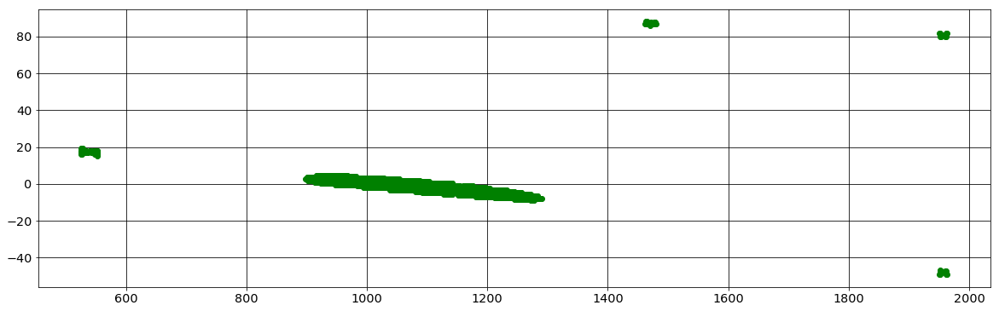

In [33]:
xtofit=[]
ytofit=[]
for iy,y in enumerate(theta_mask):
    for ix,x in enumerate(y):
        if not np.isnan(theta_mask[iy][ix]) :
            if np.abs(theta_mask[iy][ix])>deg_threshold : continue
            xtofit.append(ix)
            ytofit.append(iy)
popt, pcov = fit_line(xtofit, ytofit)
[a, b] = popt
x_new = np.linspace(xindex.min(),xindex.max(), 50)
y_new = line(x_new,a,b)
print 'Rotation angle from fit :',np.arctan(a)*180/np.pi
fig = plt.figure(figsize=[20,6])
plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-deg_threshold,vmax=deg_threshold)
plt.plot(x_new,y_new,'b-')
plt.grid(color='black', ls='solid')
plt.show()
fig = plt.figure(figsize=[20,6])
diff = []
for ix,x in enumerate(xtofit):
    diff.append(ytofit[ix]-line(x,a,b))
plt.plot(xtofit,diff,'go')
plt.grid(color='black', ls='solid')
plt.show()

For continuum spectra it is better to use analytic angles.

0  theta =  -2.7864882781
1  theta =  -2.35556190601
2  theta =  -2.02046454141
3  theta =  -1.53718042449
4  theta =  -1.10272201724
5  theta =  -2.05773408373
6  theta =  -1.77962930655
7  theta =  -1.67186371603
8  theta =  -1.49309590908
9  theta =  -1.29036364459
10  theta =  -1.2476123379
11  theta =  -1.24311039973
12  theta =  -1.4564270374
13  theta =  -1.43852672028
14  theta =  -1.43129529704
15  theta =  -0.405933581249
16  theta =  -0.624306367438
17  theta =  -1.17163810111
18  theta =  -1.29781280736
19  theta =  -1.49173362342
20  theta =  0.476724627407
21  theta =  0.11537551106
22  theta =  -0.729285964216
23  theta =  -1.16674237852
24  theta =  -1.57393609383


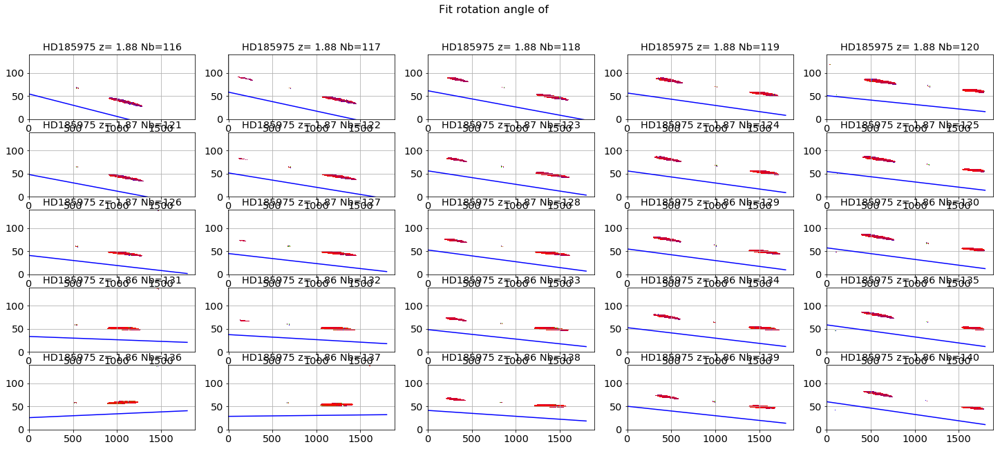

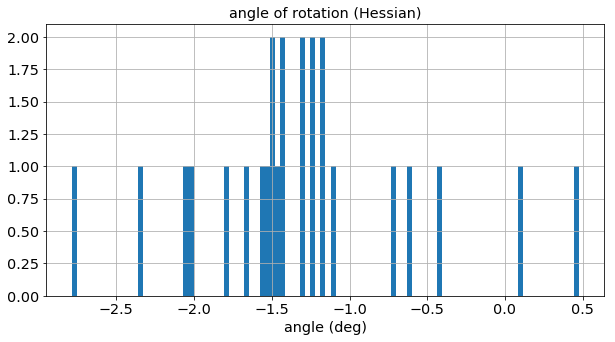

In [38]:
all_theta=ComputeRotationAngleHessian(all_images,x_guess,DeltaY,all_titles,object_name, 
   NBIMGPERROW=5, lambda_threshold = -20, deg_threshold = 8, width_cut = 70, right_edge = 1800, margin_cut=1)
figfilename=os.path.join(dir_top_images,'fit_rotation.pdf')
plt.savefig(figfilename)  

for index in range(len(all_theta)):
    print index,' theta = ',all_theta[index]
plt.figure(figsize=(10,5))
n, bins, patches=plt.hist(all_theta,bins=100,histtype='stepfilled')
plt.grid(True)
plt.title('angle of rotation (Hessian)')
plt.xlabel('angle (deg)')

### Turn the images accordingly

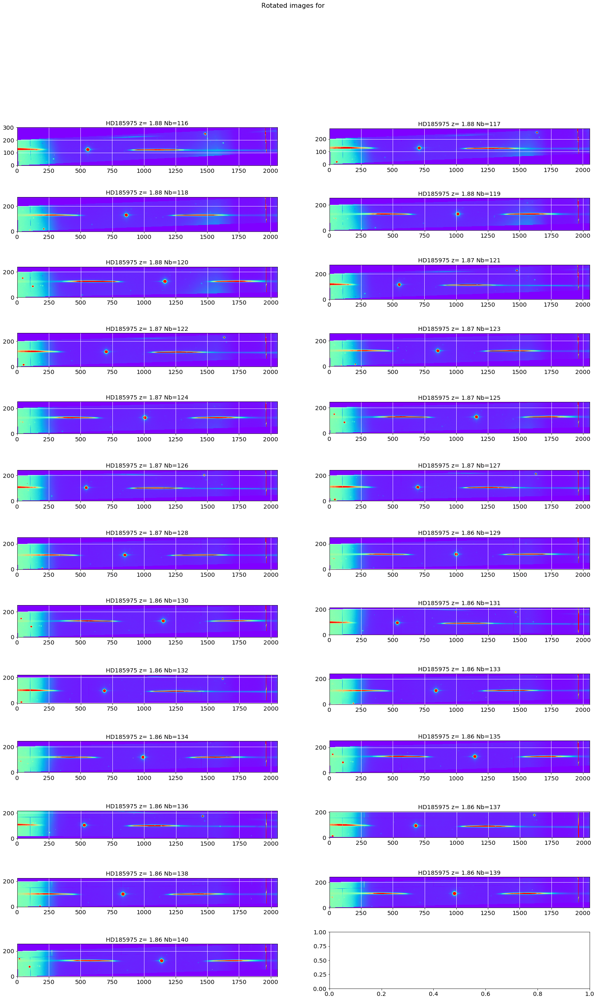

In [41]:
turned_images=TurnTheImages(all_images,all_theta,all_titles,object_name,NBIMGPERROW=2,
                            oversample_factor=1) 
figfilename=os.path.join(dir_top_images,'rotated_images.pdf')
plt.savefig(figfilename)  

### Check rotation

In case of bad rotation, check by eye

array([-0.10608003, -0.07559065,  0.03358769, -0.00071685,  0.04284784,
       -0.06523822, -0.16517987, -0.05407661,  0.00768146,  0.04907799,
       -0.12043315, -0.17942464,  0.02160339,  0.03159327,  0.06114035,
       -0.14541417, -0.24912746,  0.06946339, -0.00163016,  0.01320489,
        0.5070061 ,  0.13248737, -0.01093162,  0.01522861,  0.01546521])

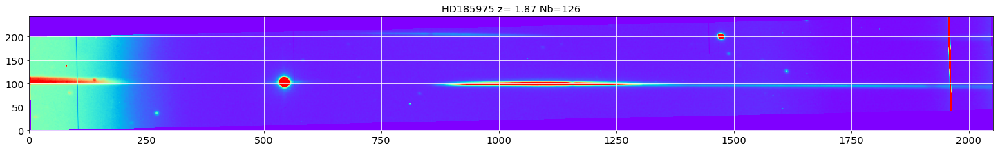

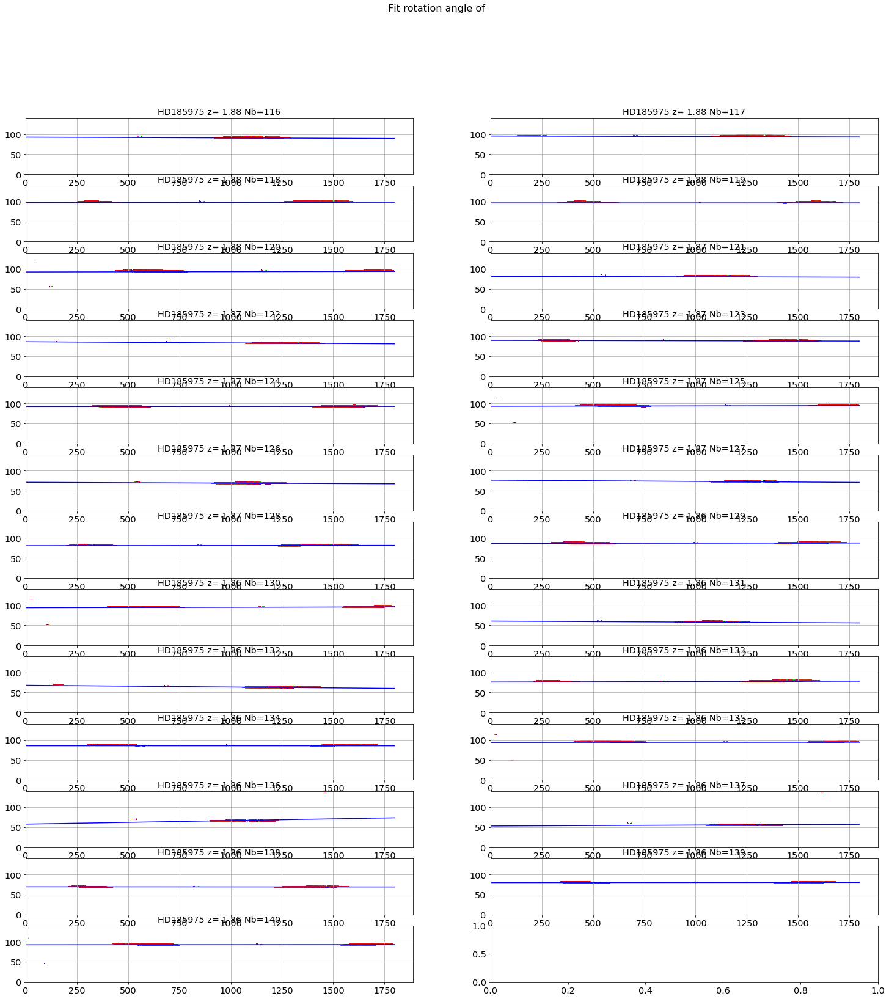

In [42]:
sel=10
plt.figure(figsize=(25,10))
plt.imshow(turned_images[sel],origin='lower',cmap='rainbow',vmin=0,vmax=1000)
plt.grid(True)
plt.title(all_titles[sel])
plt.grid(color='white', ls='solid')
figfilename=os.path.join(dir_top_images,'rotated_image_sample.pdf')
plt.savefig(figfilename)  

ComputeRotationAngleHessianAndFit(turned_images,x_guess,DeltaY,all_titles,object_name, 
            NBIMGPERROW=2, lambda_threshold = -20, deg_threshold = 8, width_cut = 70, right_edge = 1800)

Cut the extra spectra that pollute the images.

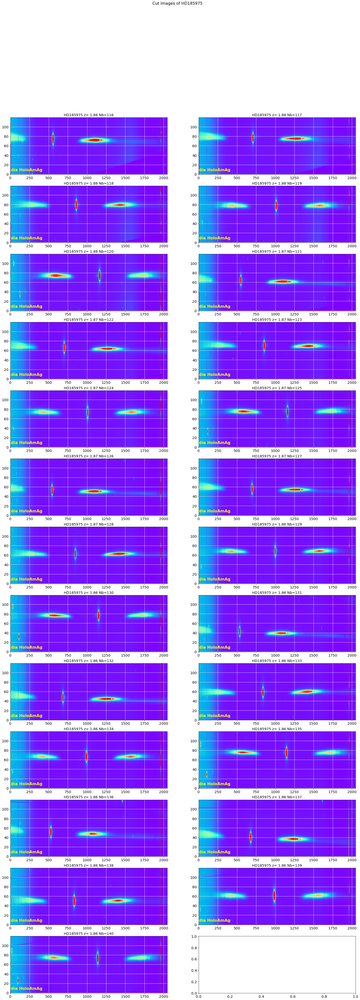

In [47]:
DeltaY_rot2 = [60]*len(all_images)
y_guess_rot2 = [110]*len(all_images)
images_cut_rot=ShowCenterImages(x_guess,y_guess_rot2,DeltaX,DeltaY_rot2,
                    turned_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=2000) 

# Find the central star locations
======================================

### Central star positions after rotation

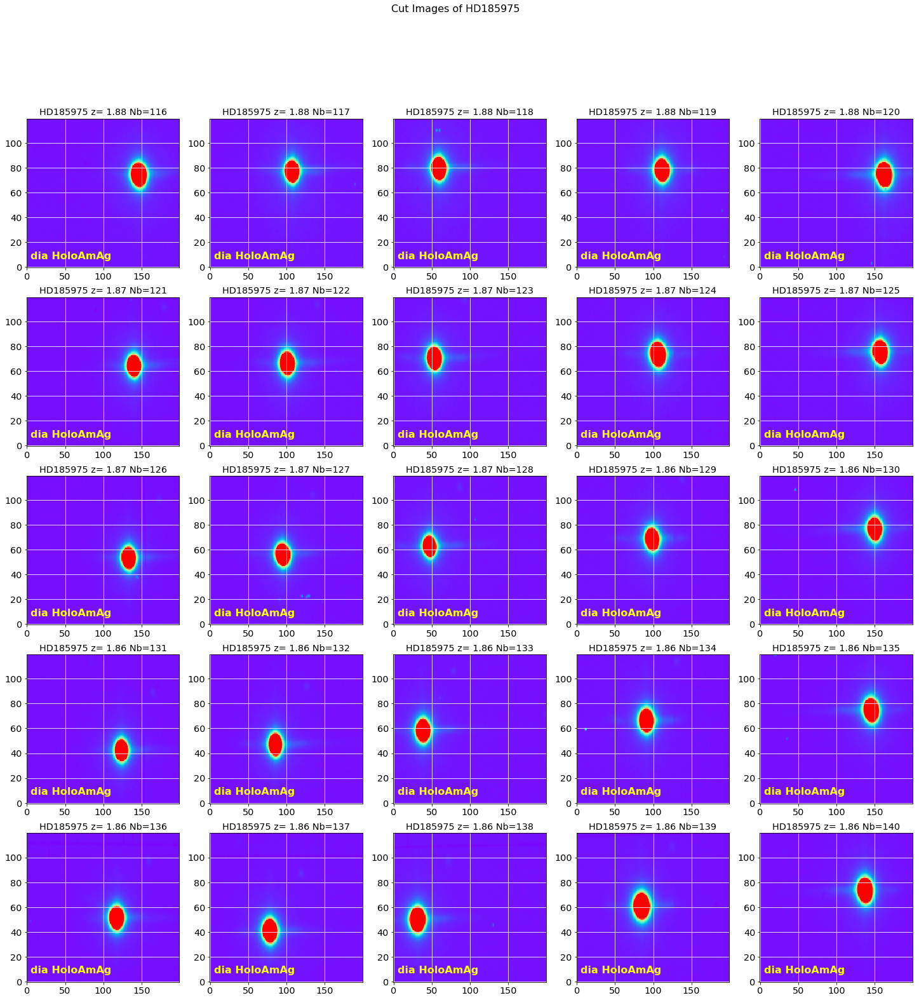

In [50]:
x_guess_rot = x_guess
y_guess_rot = DeltaY_rot2
DeltaY_rot = [70]*len(all_images)
DeltaX_rot = [100]*len(all_images)

images_cut=ShowCenterImages(x_guess_rot,y_guess_rot,DeltaX_rot,DeltaY_rot,
                    images_cut_rot,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000) 

In [52]:
# (JN) valeurs optimisées pour cette étude
img_mean,img_median,img_std,img_sources=ComputeStatImages(images_cut,fwhm=10,threshold=200,sigma=10.0,iters=5)

----------------------------------------------------------------
0  mean, median, std =  72.1556701605 52.0477393072 90.609493078
 id   xcentroid    ycentroid   ...      peak          flux          mag      
--- ------------- ------------ ... ------------- ------------- --------------
  1 145.424559029 74.451526401 ... 60674.5240428 10.5711256441 -2.56030308677
----------------------------------------------------------------
1  mean, median, std =  73.8785654274 56.7799677452 71.0791248792
 id  xcentroid     ycentroid   ...      peak          flux          mag      
--- ------------ ------------- ... ------------- ------------- --------------
  1 106.87656056 76.8740053926 ... 60672.2589748 14.9470860693 -2.93639133828
----------------------------------------------------------------
2  mean, median, std =  76.0485257783 56.9698947495 79.6973451397
 id   xcentroid     ycentroid   ...      peak          flux          mag      
--- ------------- ------------- ... ------------- -----------

### Central star position

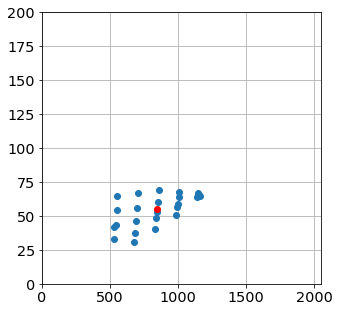

In [53]:
x_star = []
y_star = []
for index,s in enumerate(img_sources):
    thestar = None
    test = -1
    for ss in s:
        x_star.append(ss['xcentroid']+x_guess_rot[index]-DeltaX_rot[index])
        y_star.append(ss['ycentroid']+y_guess_rot[index]-DeltaY_rot[index])
        
x_mean = np.mean(x_star)
y_mean = np.mean(y_star)
img_size=all_images[0].shape
plt.figure(figsize=(5,5))
plt.plot(x_star,y_star,'o')
plt.plot(x_mean,y_mean,'ro')
plt.xlim(0,img_size[1])
plt.ylim(0,img_size[0])
plt.grid(True)

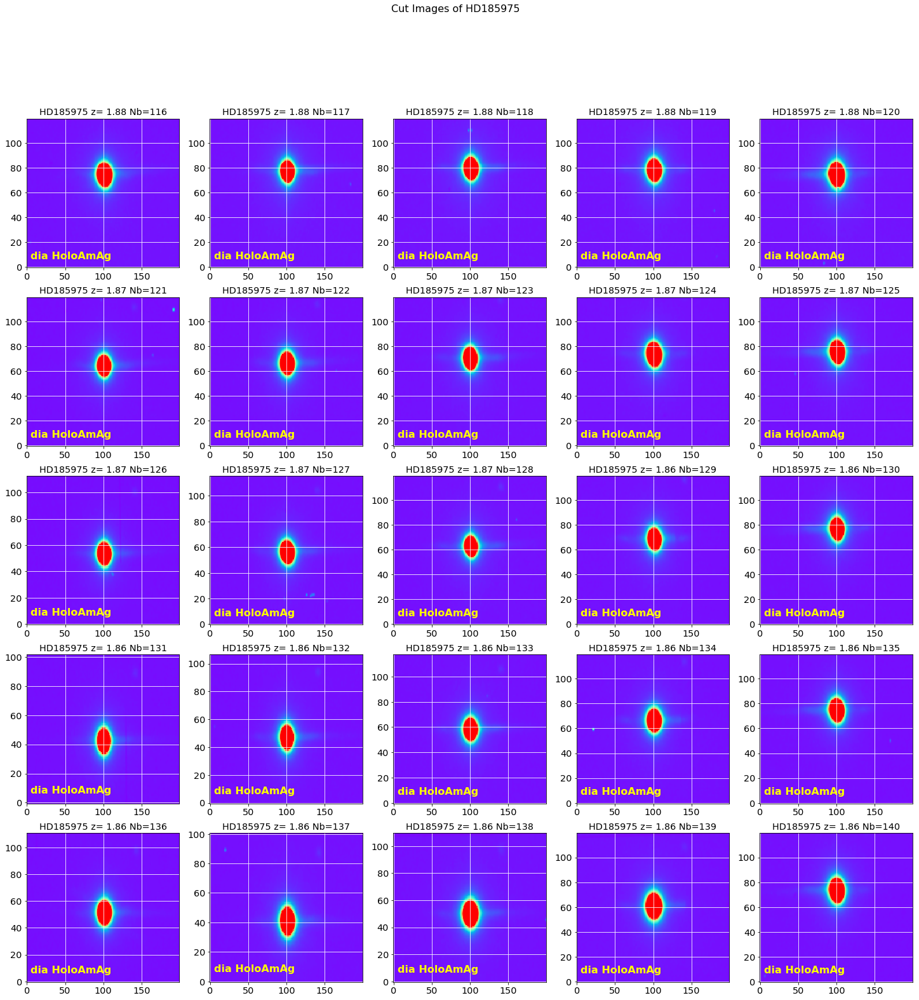

In [54]:
images_cut=ShowCenterImages(x_star,y_star,DeltaX_rot,DeltaY_rot,
                    images_cut_rot,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000) 

## Pointing positions before rotations

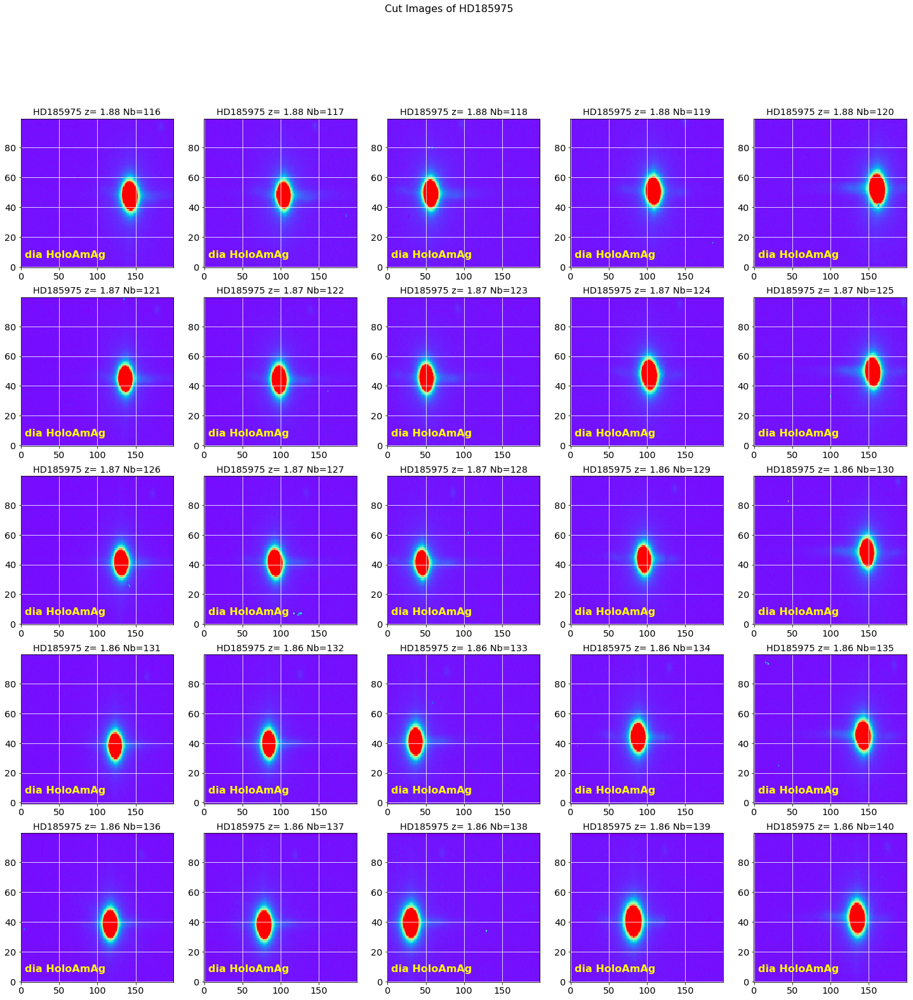

In [55]:
DeltaY_rot = [50]*len(all_images)
DeltaX_rot = [100]*len(all_images)
images_raw_cut=ShowCenterImages(x_guess,DeltaY,DeltaX_rot,DeltaY_rot,
                    images_raw,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000) 

In [57]:
# (JN) valeurs optimisées pour cette étude
img_mean,img_median,img_std,img_sources=ComputeStatImages(images_raw_cut,fwhm=10,threshold=200,sigma=10.0,iters=5)

----------------------------------------------------------------
0  mean, median, std =  79.7672588832 54.0 123.076363543
 id   xcentroid     ycentroid   ...   peak       flux          mag      
--- ------------- ------------- ... ------- ------------- --------------
  1 141.307308364 47.9032681344 ... 60673.0 8.47716646644 -2.32062677875
----------------------------------------------------------------
1  mean, median, std =  80.1548138379 59.0 94.3280049746
 id   xcentroid     ycentroid   ...   peak       flux          mag      
--- ------------- ------------- ... ------- ------------- --------------
  1 103.554498423 48.0547549255 ... 60670.0 11.9460628864 -2.69306199157
----------------------------------------------------------------
2  mean, median, std =  82.7846520834 60.0 103.813715294
 id   xcentroid     ycentroid   ...   peak       flux          mag      
--- ------------- ------------- ... ------- ------------- --------------
  1 55.8158684664 49.1234603335 ... 60667.0 10.507

[[  551.30730836   372.90326813]
 [  703.55449842   373.05475493]
 [  855.81586847   374.12346033]
 [ 1008.06337953   375.7854733 ]
 [ 1160.68693325   377.55302396]
 [  545.67080407   519.64736992]
 [  697.69311952   519.19922498]
 [  850.33606662   520.3201405 ]
 [ 1002.45995138   522.84419713]
 [ 1154.84910956   524.50526693]
 [  539.986716     666.34866661]
 [  691.89303587   666.52968034]
 [  844.47632394   666.16349182]
 [  995.64029784   668.62387415]
 [ 1147.86656819   673.01743406]
 [  532.44188554   813.6189856 ]
 [  684.23090187   814.89985308]
 [  836.23956277   816.34555134]
 [  988.44091936   819.23998694]
 [ 1142.40871131   820.56607817]
 [  525.84340095   963.82836195]
 [  677.9641173    963.33648921]
 [  830.1010036    964.58967793]
 [  982.1355323    965.81793452]
 [ 1134.58295789   967.80852934]]
[555.42455902887571, 706.87656056002413, 858.94131256235517, 1010.5523501545574, 1162.1024105857514, 549.16874807193517, 700.50897421299317, 853.03342408580056, 1005.01203432

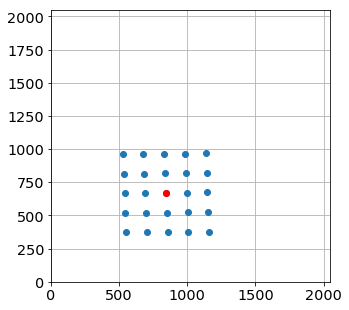

In [58]:
x_pointing = []
y_pointing = []
for index,s in enumerate(img_sources):
    for ss in s:
        x_pointing.append(ss['xcentroid']+x_guess[index]-DeltaX_rot[index])
        y_pointing.append(ss['ycentroid']+y_guess[index]-DeltaY_rot[index])
        
x_mean = np.mean(x_pointing)
y_mean = np.mean(y_pointing)
img_size=all_images[0].shape
order0_positions = np.array([x_pointing,y_pointing]).T
print order0_positions
print x_star
plt.figure(figsize=(5,5))
plt.plot(order0_positions.T[0],order0_positions.T[1],'o')
plt.plot(x_mean,y_mean,'ro')
plt.xlim(0,IMSIZE)
plt.ylim(0,IMSIZE)
plt.grid(True)

## Save results

In [59]:
newfullfilenames=[]
for idx,f in np.ndenumerate(sorted_files):
    short_infilename=f.split("/")[-1]
    short_partfilename=re.findall('^cutimg_(.*)',short_infilename)
    short_outfilename='rotimg_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

for idx,f in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=images_cut_rot[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(f,overwrite=True)
textfilename=os.path.join(outputdir,'star_centroids.txt')
print textfilename
np.savetxt(textfilename,order0_positions,header="y_star x_star",fmt='%d')

!ls -l rotated_fitsimages

./rotated_fitsimages/star_centroids.txt
total 96816
-rw-r--r--  1 jneveu  staff  1978560 16 aoû 11:18 rotimg_20170531_116.fits
-rw-r--r--  1 jneveu  staff  1978560 16 aoû 11:18 rotimg_20170531_117.fits
-rw-r--r--  1 jneveu  staff  1978560 16 aoû 11:18 rotimg_20170531_118.fits
-rw-r--r--  1 jneveu  staff  1978560 16 aoû 11:18 rotimg_20170531_119.fits
-rw-r--r--  1 jneveu  staff  1978560 16 aoû 11:18 rotimg_20170531_120.fits
-rw-r--r--  1 jneveu  staff  1978560 16 aoû 11:18 rotimg_20170531_121.fits
-rw-r--r--  1 jneveu  staff  1978560 16 aoû 11:18 rotimg_20170531_122.fits
-rw-r--r--  1 jneveu  staff  1978560 16 aoû 11:18 rotimg_20170531_123.fits
-rw-r--r--  1 jneveu  staff  1978560 16 aoû 11:18 rotimg_20170531_124.fits
-rw-r--r--  1 jneveu  staff  1978560 16 aoû 11:18 rotimg_20170531_125.fits
-rw-r--r--  1 jneveu  staff  1978560 16 aoû 11:18 rotimg_20170531_126.fits
-rw-r--r--  1 jneveu  staff  1978560 16 aoû 11:18 rotimg_20170531_127.fits
-rw-r--r--  1 jneveu  staff  1978560 16 aoû 11:1

# Extract spectra
===================================

In [60]:
outputdir="./spectrum_fitsspec"
ensure_dir(outputdir)

inputdir="./rotated_fitsimages"
SelectTagRe='^rotimg_%s_([0-9]+).fits$' % date # regular expression to select the file
SearchTagRe='^rotimg_%s_[0-9]+.fits$' % date

sorted_numbers,sorted_files = MakeFileList([inputdir],MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 

all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

Number of images: 25


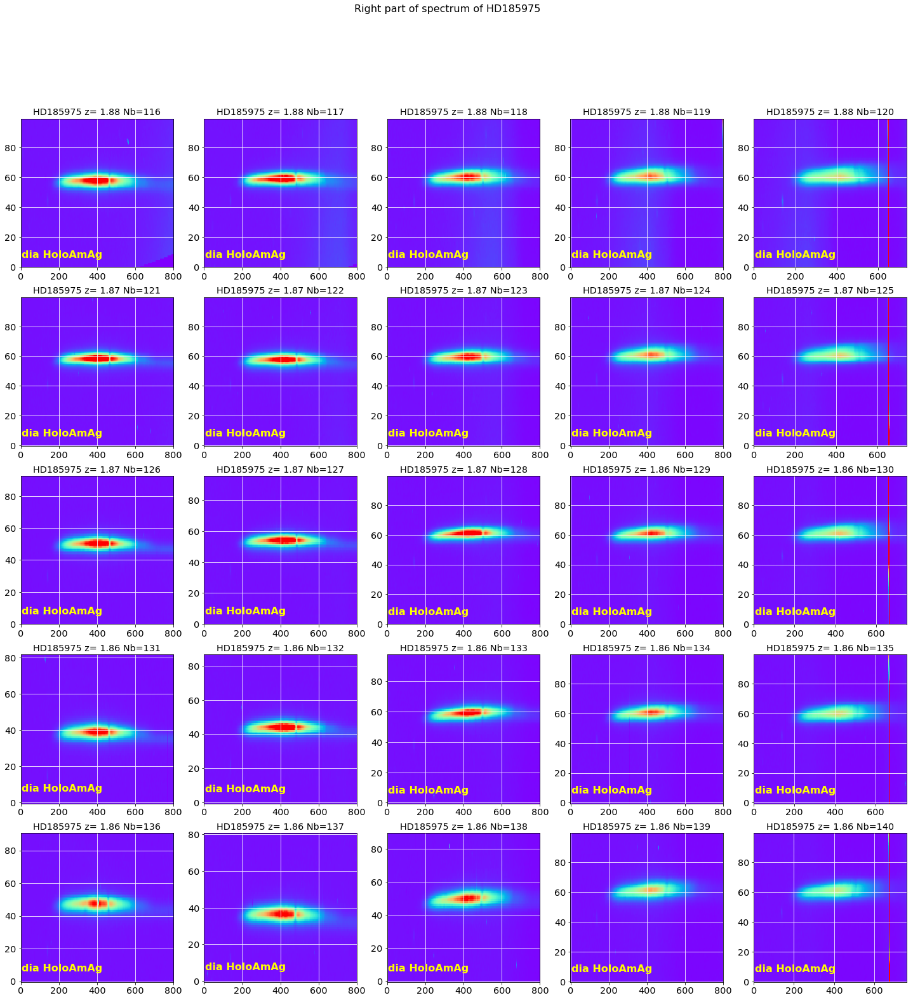

In [63]:
# Right spectrum
x_guess_right = []
for x in x_star :
    x_guess_right.append(min(IMSIZE-1,x+550))
ShowCenterImages(x_guess_right,y_star,[400]*len(all_images),[50]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000)
title='Right part of spectrum of {} '.format(object_name)
plt.suptitle(title,size=16)
figfilename=os.path.join(dir_top_images,'rightorder.pdf')
plt.savefig(figfilename)  

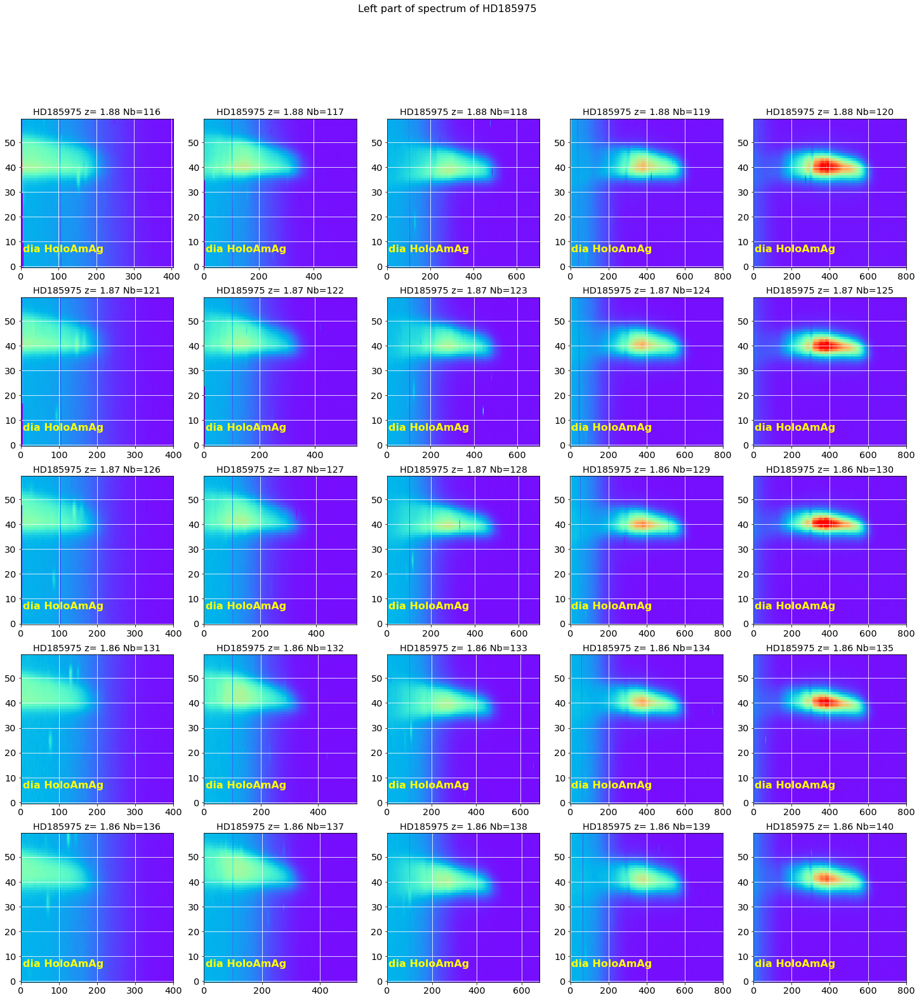

In [64]:
# Left spectrum
x_guess_left = []
for x in x_star :
    x_guess_left.append(max(1,x-550))
ShowCenterImages(x_guess_left,y_star,[400]*len(all_images),[30]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000)
title='Left part of spectrum of {} '.format(object_name)
plt.suptitle(title,size=16)
figfilename=os.path.join(dir_top_images,'leftorder.pdf')
plt.savefig(figfilename)  

### Extraction

[73,
 75,
 79,
 77,
 74,
 62,
 64,
 69,
 73,
 75,
 51,
 54,
 62,
 68,
 76,
 40,
 45,
 59,
 66,
 75,
 49,
 39,
 50,
 61,
 74]

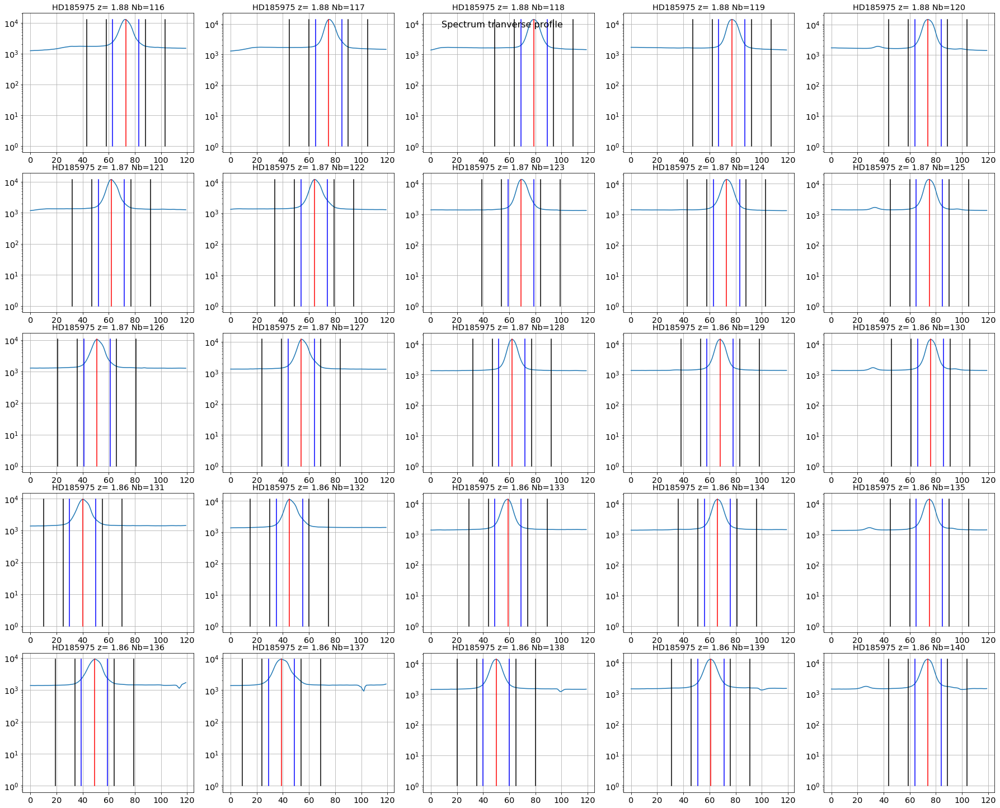

In [136]:
ShowTransverseProfile(all_images,all_titles,object_name,all_expo,NBIMGPERROW=5,DeltaX=2000,w=10,ws=[15,30],right_edge=1800)

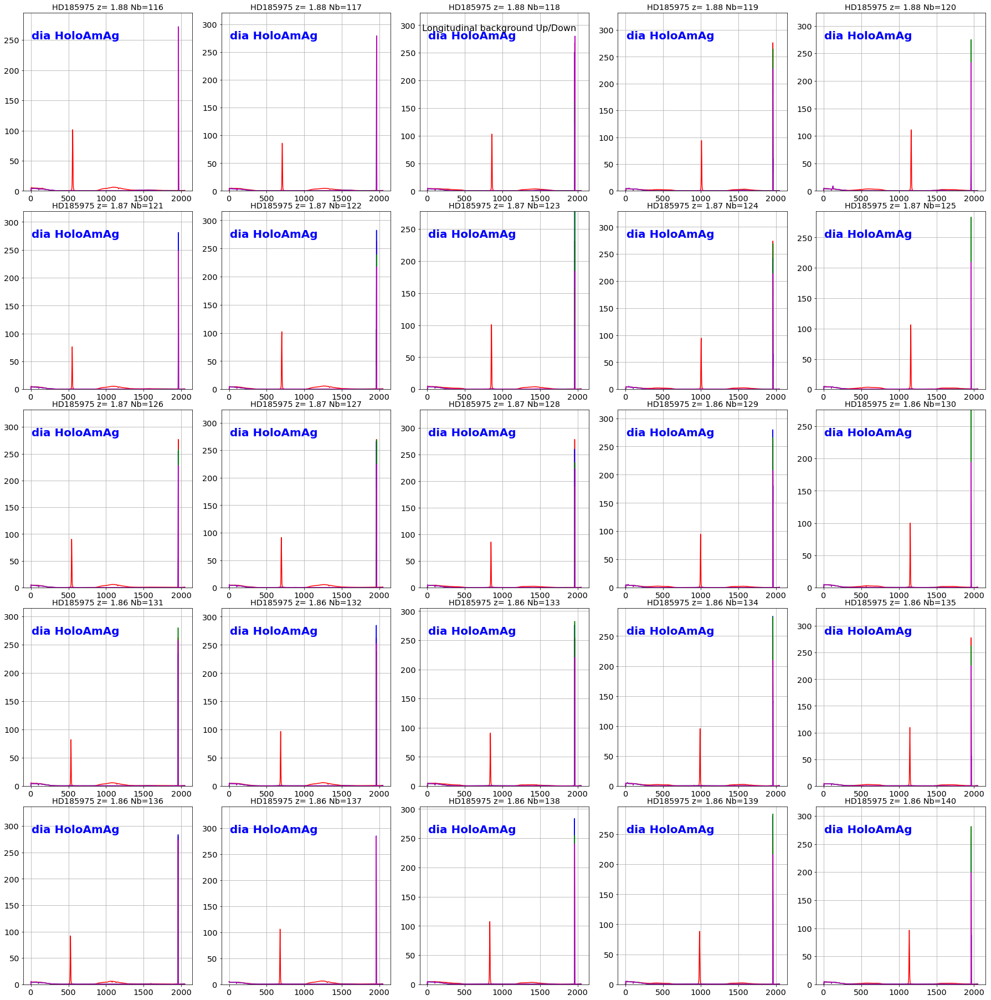

In [137]:
thespectra,thespectraUp,thespectraDown=ExtractSpectra(y_star,all_images,all_titles,object_name,all_expo,
                                                      w=10,ws=[15,30],right_edge=IMSIZE)

Clean_Up, Clean_Do,Clean_Av=CleanBadPixels(thespectraUp,thespectraDown) 

ShowLongitBackground(thespectra,Clean_Up,Clean_Do,Clean_Av,all_titles,all_filt,object_name,
                     NBIMGPERROW=5,right_edge=IMSIZE)
figfilename=os.path.join(dir_top_images,'background_longprofile.pdf')
plt.savefig(figfilename)   

(0, 100.0)

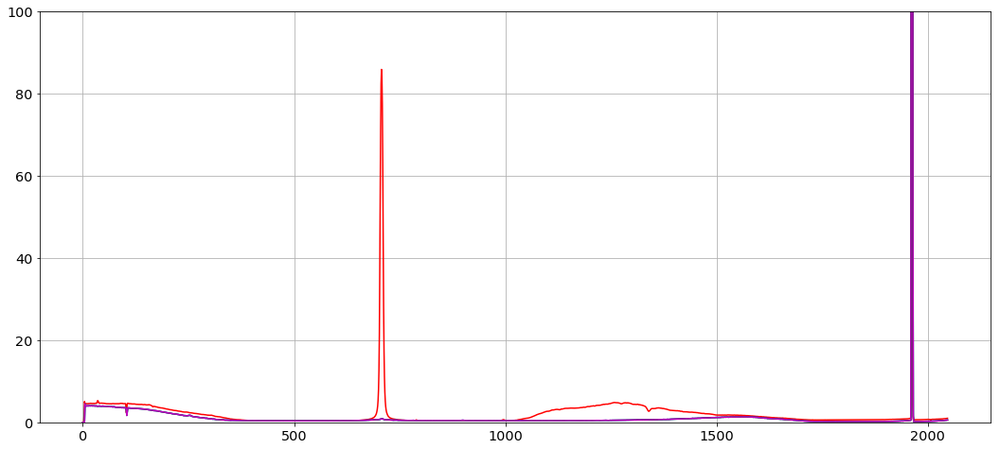

In [138]:
sel=1
plt.figure(figsize=(18,8))
plt.plot(thespectra[sel],'r-') 
plt.plot(Clean_Up[sel],'b-') 
plt.plot(Clean_Do[sel],'g-')
plt.plot(Clean_Av[sel],'m-')
plt.grid(True)
plt.ylim(0,100.)

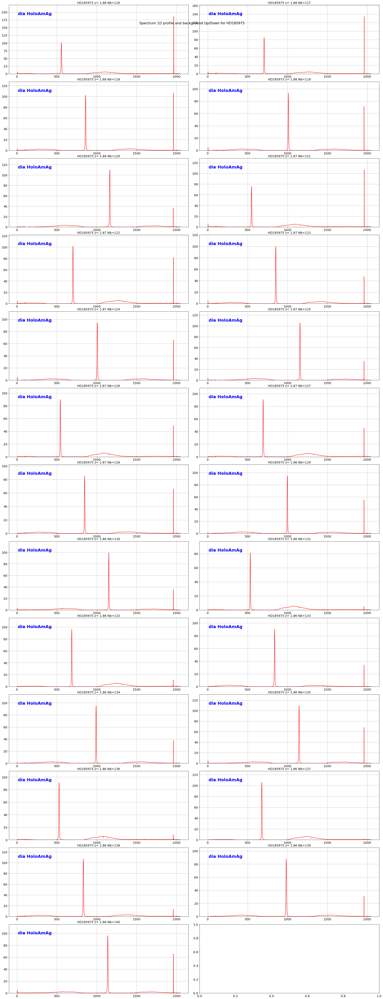

In [139]:
thecorrspectra=CorrectSpectrumFromBackground(thespectra,Clean_Av)

ShowSpectrumProfile(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=2)
figfilename=os.path.join(dir_top_images,'correctedspectrum_profile.pdf')
plt.savefig(figfilename) 

# Grating characterisation

dia HoloAmAg:	 gaussian center x=555.95+/-0.04
dia HoloAmAg:	 gaussian center x=707.26+/-0.03
dia HoloAmAg:	 gaussian center x=859.31+/-0.03
dia HoloAmAg:	 gaussian center x=1011.05+/-0.03
dia HoloAmAg:	 gaussian center x=1162.81+/-0.04
dia HoloAmAg:	 gaussian center x=549.49+/-0.03
dia HoloAmAg:	 gaussian center x=700.81+/-0.04
dia HoloAmAg:	 gaussian center x=853.41+/-0.03
dia HoloAmAg:	 gaussian center x=1005.71+/-0.04
dia HoloAmAg:	 gaussian center x=1157.52+/-0.03
dia HoloAmAg:	 gaussian center x=542.63+/-0.03
dia HoloAmAg:	 gaussian center x=694.81+/-0.04
dia HoloAmAg:	 gaussian center x=847.26+/-0.03
dia HoloAmAg:	 gaussian center x=998.39+/-0.03
dia HoloAmAg:	 gaussian center x=1150.34+/-0.04
dia HoloAmAg:	 gaussian center x=533.26+/-0.03
dia HoloAmAg:	 gaussian center x=685.64+/-0.03
dia HoloAmAg:	 gaussian center x=838.70+/-0.04
dia HoloAmAg:	 gaussian center x=990.87+/-0.04
dia HoloAmAg:	 gaussian center x=1145.46+/-0.04
dia HoloAmAg:	 gaussian center x=526.96+/-0.03
dia Hol

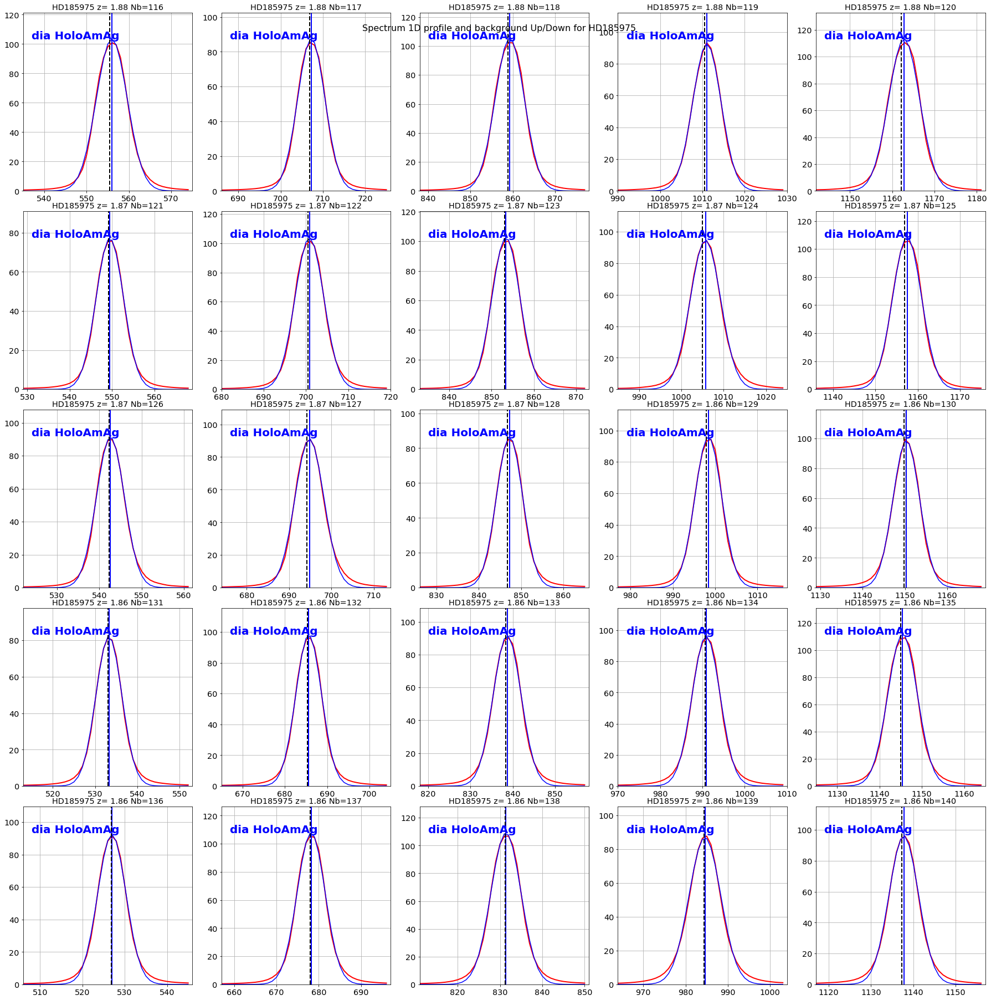

In [75]:
# Zero order profile
xlims_zero = []
for x in x_star :
    xlims_zero.append([x-20,x+20])
ShowSpectrumProfileFit(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5,
                       xlim=xlims_zero,guess=[10,800,100],vertical_lines=x_star)
print 'CCDPROC star centers:'
print x_star

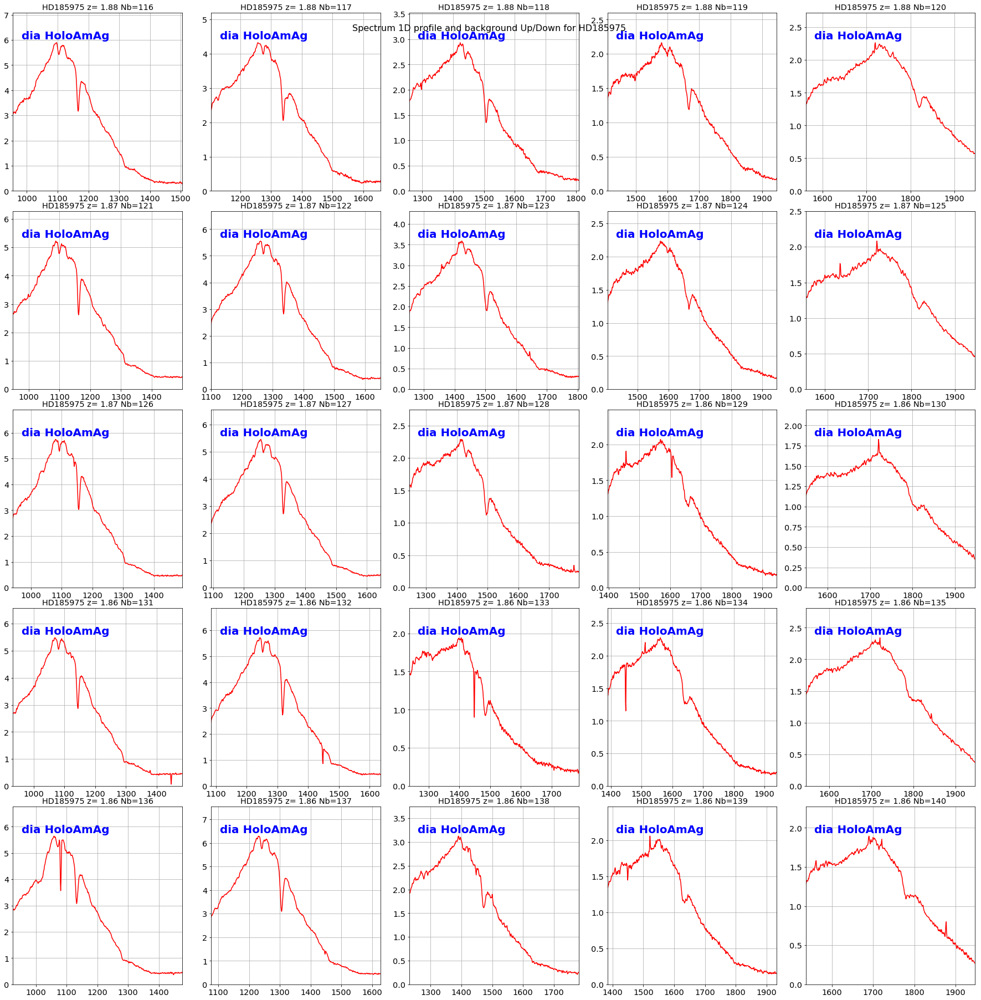

In [221]:
# Right spectrum profile
right_edge = thecorrspectra[0].shape[0]-100
xlims_right = []
for x in x_guess_right :
    if x == right_edge-1 :
        xlims_right.append([IMSIZE-2,IMSIZE-1])
    else :
        xlims_right.append([max(1,min(right_edge-2,int(x-150))),min(right_edge-1,int(x+400))])
ShowSpectrumProfile(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5,xlim=xlims_right)

 MAIN_ID        RA           DEC      ... SP_QUAL_77    SP_BIBCODE_77   
             "h:m:s"       "d:m:s"    ...                               
--------- ------------- ------------- ... ---------- -------------------
HD 185975 20 28 18.7284 -87 28 19.941 ...          C 1975MSS...C01....0H
-------------------------------------
Loading /Users/jneveu/Documents/LSST/Calibration/CDBS/calspec/hd185975_stis_001.fits
Loading /Users/jneveu/Documents/LSST/Calibration/CDBS/calspec/hd185975_stis_002.fits
Loading /Users/jneveu/Documents/LSST/Calibration/CDBS/calspec/hd185975_stis_003.fits
Load hologram HoloAmAg:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -1.9 degrees
Hologram center at x0 = 1070.9 and y0 = 586.1 with average tilt of -1.9 degrees
Order  0 position at x0 = 805.1 and y0 = 595.0
Order +1 position at x0 = 1336.6 and y0 = 577.3
Distance between the orders: 531.79 pixels (12.76 mm)
-----------------------------------------------------
Wavelenght total shift: 8.31nm (

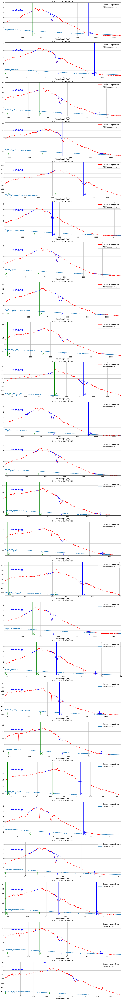

In [229]:
all_grat = []
for f in all_filt :
    all_grat.append(f.replace('dia ',''))

CALSPEC = Target("HD185975")
print '-------------------------------------'

CalibrateSpectra(thecorrspectra,0,x_star,order0_positions,all_titles,object_name,all_grat,
    xlim=xlims_right,target=CALSPEC,order=1,emission_spectrum=False,atmospheric_lines=True,hydrogen_only=True,
                 verbose=True,dir_top_images=dir_top_images) 

## Analyse angles to find hologram center

### with line crossing

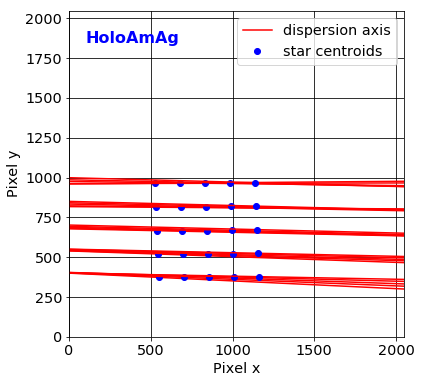

In [79]:
plot_dispersion_axis(order0_positions,all_theta,holo_name=holo_name)

Hologram center at x0 = 990.7 and y0 = 800.0 with average tilt of -1.4 degrees


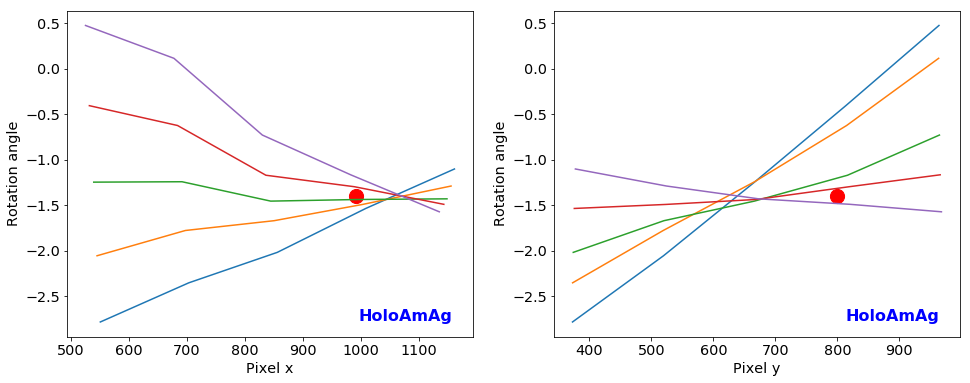

In [80]:
proj_x_lines, proj_y_lines = RotationLines(all_theta,order0_positions)
x_center, y_center, theta0 = FindHoloCenter(all_theta,order0_positions,proj_x_lines, proj_y_lines)

plot_rotation_lines(proj_x_lines,proj_y_lines,holo_name=holo_name,center=[x_center, y_center, theta0])

### with surface analysis

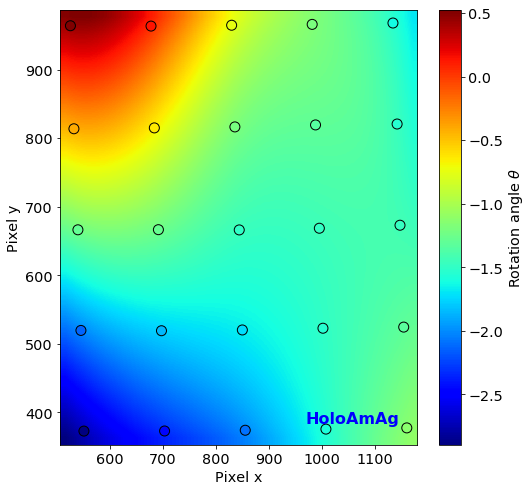

In [81]:
theta_xx,theta_yy,theta_z,theta_interp = scatter_interpol(order0_positions,all_theta,margin=10,kind='cubic',
                                        plot=True,holo_name=holo_name,zlabel='Rotation angle $\\theta$')

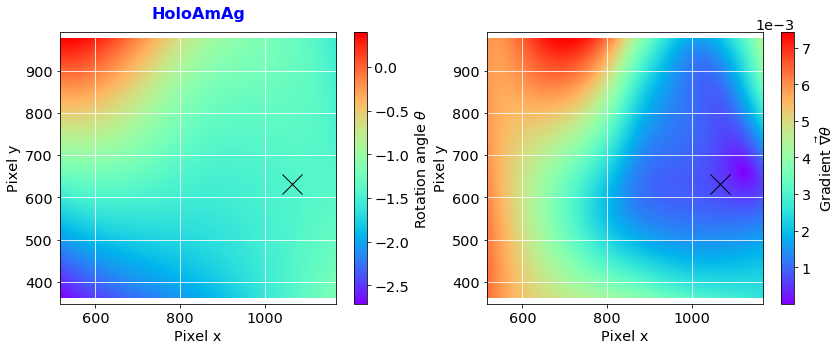

Minimum gradient of image: 5.0995450305e-06
Hessian determinant at minimum: -8.31931276387e-11 (if negative: saddle point)
Center at x0 = 1065.8 and y0 = 632.9 with average tilt of -1.42 degrees


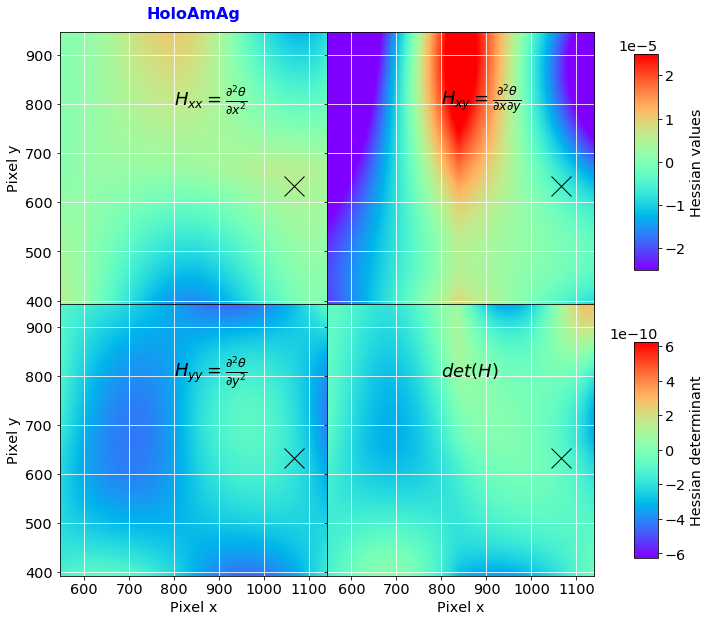

In [82]:
margin = 30

surface_gradient(theta_xx,theta_yy,theta_z,margin=margin,plot=True,holo_name=holo_name,dir_top_images=dir_top_images)

x_center, y_center, theta_tilt = saddle_point(theta_xx,theta_yy,theta_z,theta_interp,margin=margin,plot=True,verbose=True,
                                holo_name=holo_name,vmin=-0.000025,vmax=0.000025,dir_top_images=dir_top_images) 

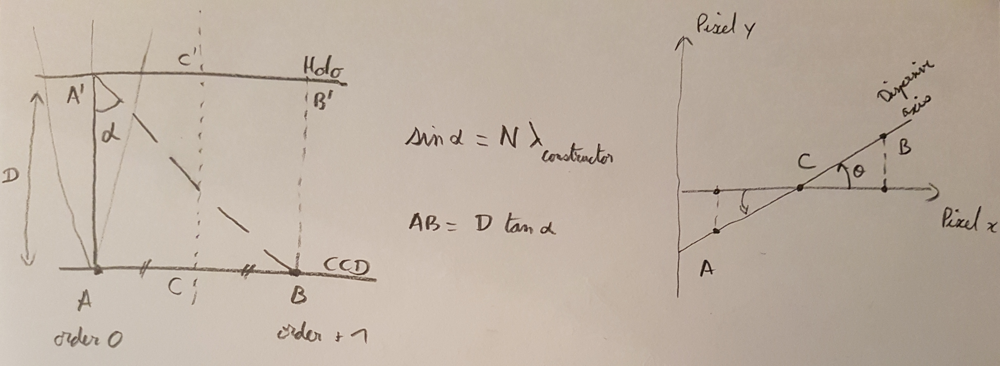

In [83]:
Image(filename='../../common_tools/pictures/hologram_centers.jpg')

-----------------------------
Load hologram HoloAmAg:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -1.9 degrees
Hologram center at x0 = 1070.9 and y0 = 586.1 with average tilt of -1.9 degrees
Order  0 position at x0 = 805.1 and y0 = 595.0
Order +1 position at x0 = 1336.6 and y0 = 577.3
Distance between the orders: 531.79 pixels (12.76 mm)
-----------------------------
Use imported N() function to compute order0 and order1 positions:
Order  0 position at x0 = 800.4 and y0 = 639.7
Order +1 position at x0 = 1331.3 and y0 = 626.1
Distance between the orders: 531.06 pixels (12.75 mm)
655 615
[332.13010097677591, 344.1913299396706, 352.89312962544614, 357.74358335381208, 359.0620250740612, 332.06123502015726, 344.41676186072254, 353.44644615961653, 358.5464029558986, 359.87118249475907, 331.02127069156029, 343.48774741149543, 352.74264084192754, 358.02823617050962, 359.53075934210847, 328.84018326251527, 341.29915425610506, 350.6205215498095, 356.13410280749417, 358.0386047

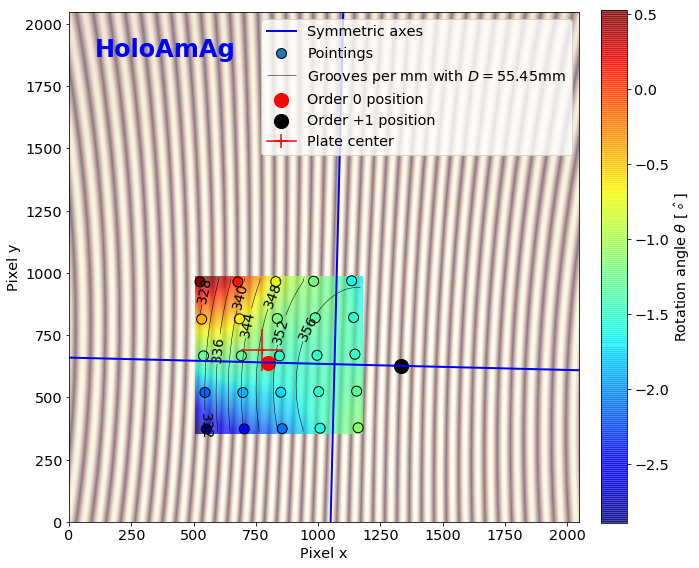

In [205]:
from holo_specs import *
print '-----------------------------'
H = Hologram(holo_name)
print '-----------------------------'
print 'Use imported N() function to compute order0 and order1 positions:'
xs, line1, line2 = neutral_lines(x_center,y_center,theta_tilt)
order0_position, order1_position, AB = find_order01_positions([x_center,y_center],H.N,theta_interp)

fig=plt.figure(figsize=(10,10))
# Background hologram shape
plt.imshow(H.hologram_shape,origin='lower', alpha=0.5, cmap=cm.pink)
# Pointings with rotation angle
x, y = np.array(order0_positions).T
plt.scatter(x, y, c=all_theta, label='Pointings',s=100, cmap=cm.jet, marker='o',vmin=np.min(all_theta), vmax=np.max(all_theta),edgecolors='k')
im = plt.imshow(theta_z, alpha=0.7,extent=[np.min(theta_xx)-margin, np.max(theta_xx)+margin, np.min(theta_yy)-margin, np.max(theta_yy)+margin],origin='lower',aspect='auto',cmap=cm.jet)
# Hologram resolution
Ns = []
for i in range(len(x)):
    Ns.append(H.N([x[i],y[i]]))
N_xx,N_yy,N_z,N_interp = scatter_interpol(order0_positions,Ns,margin=10,kind='cubic',plot=False)
CS = plt.contour(N_xx,N_yy,N_z,10,linewidths=0.5,colors='k',label='Grooves per mm')
plt.clabel(CS, inline=1, fontsize=14,fontweight='bold',fmt='%d')
labels = ['Grooves per mm with $D=%.4g$mm' % DISTANCE2CCD]
for i in range(len(labels)):
    CS.collections[i].set_label(labels[i])
# Hologram geometry
plt.plot(xs,line1,'b-',label='Symmetric axes',lw=2)
plt.plot(xs,line2,'b-',lw=2)
plt.scatter(order0_position[0],order0_position[1],s=200,facecolor='red',label='Order 0 position')
plt.scatter(order1_position[0],order1_position[1],s=200,facecolor='black',label='Order +1 position')
plt.errorbar(0.5*IMSIZE+PLATE_CENTER_SHIFT_X/PIXEL2MM,0.5*IMSIZE+PLATE_CENTER_SHIFT_Y/PIXEL2MM,xerr=PLATE_CENTER_SHIFT_X_ERR/PIXEL2MM,yerr=PLATE_CENTER_SHIFT_Y_ERR/PIXEL2MM,marker='+',color='red',label='Plate center')
# Axis and colobar settings
plt.xlabel('Pixel x')
plt.ylabel('Pixel y')
plt.annotate(holo_name,xy=(0.05,0.95),xytext=(0.05,0.95),fontsize=24,verticalalignment='top',
                  fontweight='bold',color='blue',horizontalalignment='left',xycoords='axes fraction')
plt.xlim([0,IMSIZE])
plt.ylim([0,IMSIZE])
plt.gca().set_aspect('equal', adjustable='box')
#divider = make_axes_locatable(ax)
#cax = divider.append_axes("right", size="5%", pad=0.05)
cb = fig.colorbar(im,fraction=0.046, pad=0.04)#, cax=cbar_ax)
cb.formatter.set_powerlimits((0, 0))
cb.update_ticks()
cb.set_label('Rotation angle $\\theta$ [$\^\circ$]') #,fontsize=16)
plt.legend()
figfilename=os.path.join(dir_top_images,'%s_geometry.pdf' % holo_name)
plt.savefig(figfilename, bbox_inches='tight', rasterized=True, dpi=300)  
plt.show()

## Extract FWHM profiles

Ajuster les paramètres ici pour supprimes les lignes blanches, étoiles proches, etc... et les propager dans la fonction FWHMProfiles

FWHM = 8.7


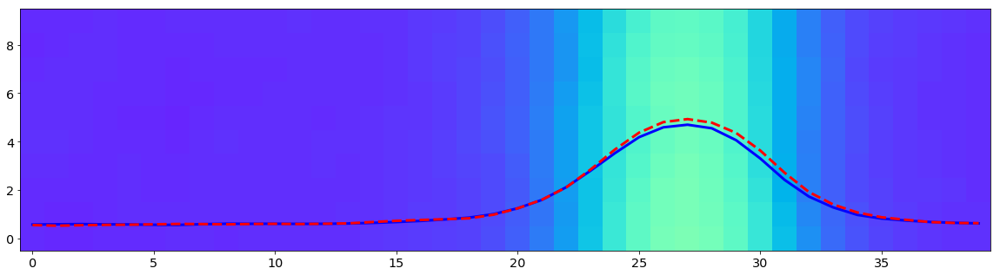

In [96]:
index=0
x_0=int(x_star[index])
y_0=int(y_star[index])
xtest = 1300
width_to_stack = 10
central_star_cut = 100
width_cut = 20
edge_cut = 1900
full_image=np.copy(all_images[index])
image=full_image[y_0-width_cut:y_0+width_cut,0:edge_cut]/all_expo[index]
image[:,x_0-central_star_cut:x_0+central_star_cut]=0 ## TURN OFF CENTRAL STAR
profile = np.median(image.T[xtest:xtest+width_to_stack],axis=0)
print 'FWHM =',fwhm(range(image.shape[0]),profile)
fig=plt.figure(figsize=(20,6))
plt.imshow(image.T[xtest:xtest+width_to_stack],origin='lower',cmap='rainbow',vmin=0,vmax=10)
plt.plot(range(image.shape[0]),profile,'b-',lw=3)
plt.plot(range(image.shape[0]),image.T[xtest],'r--',lw=3)
plt.show()

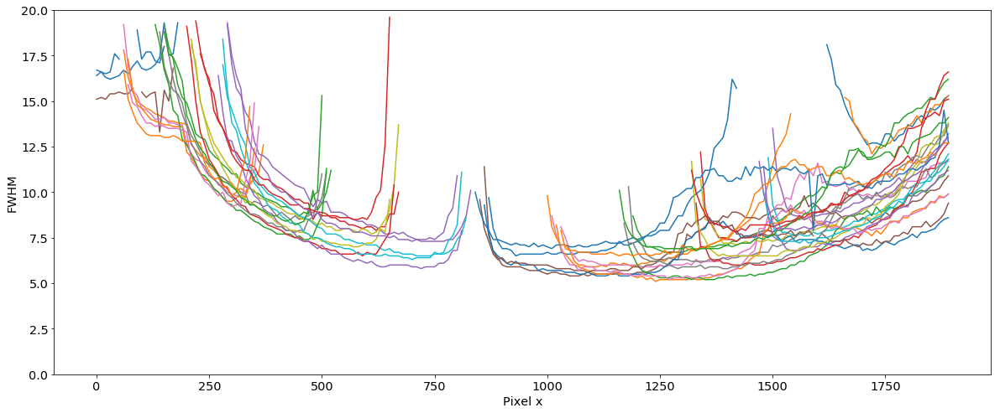

In [115]:
theprofiles = FWHMProfiles(all_images,x_star,y_star,all_expo,all_titles,object_name,all_filt,
        width_to_stack=10,central_star_cut = 100, width_cut = 20, left_edges = None, right_edges = None, max_fwhm=20)

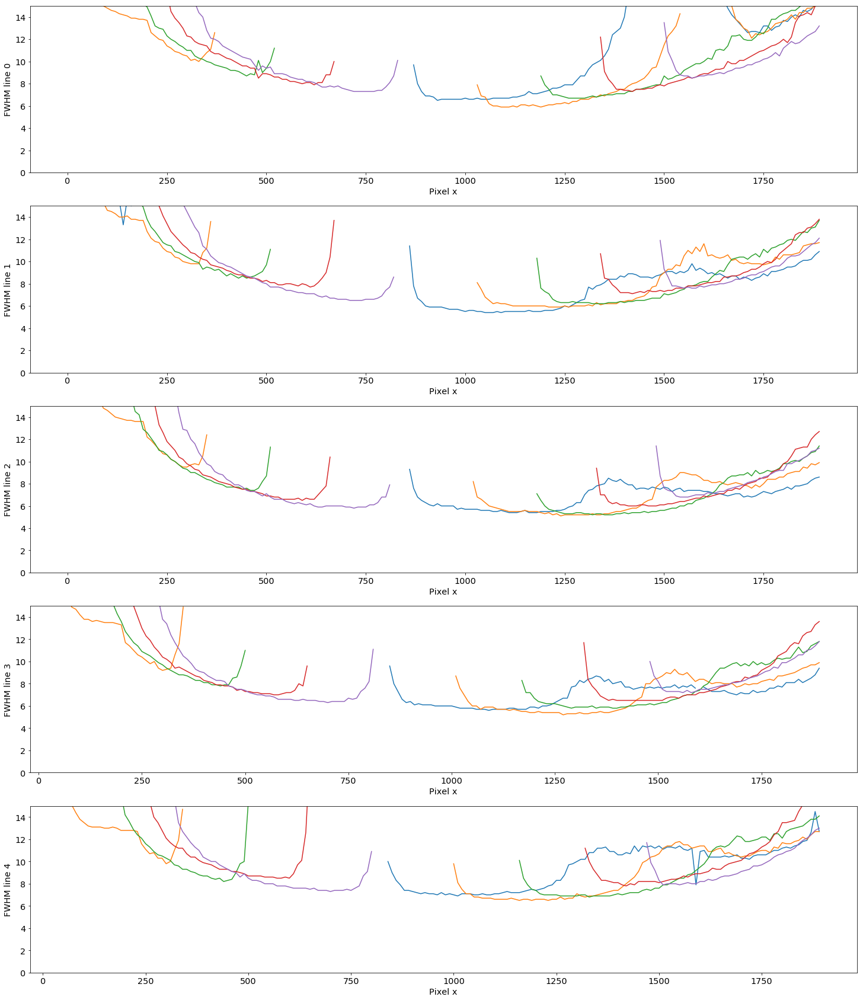

In [116]:
f, axarr = plt.subplots(5,1,figsize=(25,30))
for i in range(5):
    for j in range(5):
        profile = theprofiles[5*i + j %5]
        axarr[i].plot(profile[0],profile[1])
        axarr[i].set_xlabel('Pixel x')
        axarr[i].set_ylabel('FWHM line %d' % i)
        axarr[i].set_ylim([0,15])
plt.show()

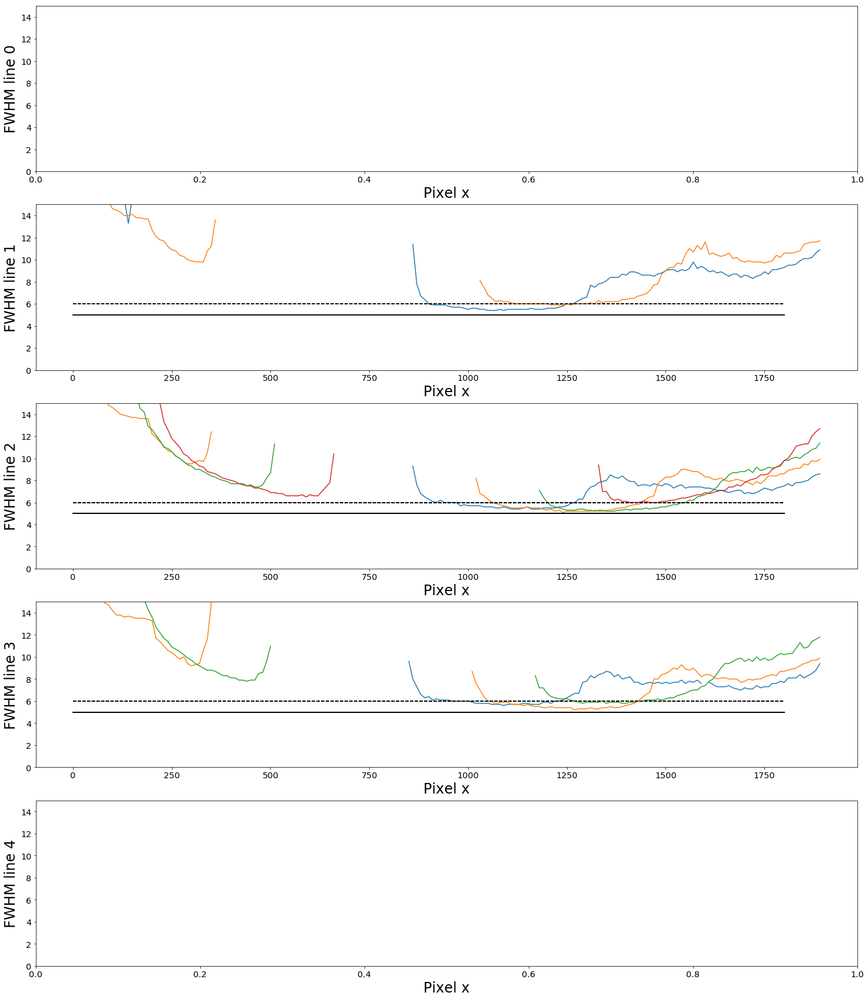

In [128]:
# Don't plot profiles with FWHM>5 in the right part
threshold_loose = 6
threshold_high = 5
right_part = 1200
right_edge = 1800
f, axarr = plt.subplots(5,1,figsize=(25,30))
selected_centers_loose = []
selected_centers_high = []
for i in range(5):
    for j in range(5):
        profile = theprofiles[5*i + j %5]
        skip = True
        high = False
        for k,f in enumerate(profile[1]) :
            if f < threshold_loose and profile[0][k]>right_part and profile[0][k]<right_edge : 
                skip = False
                if f < threshold_high : high = True
        axarr[i].set_xlabel('Pixel x',fontsize=24)
        axarr[i].set_ylabel('FWHM line %d' % i,fontsize=24)
        axarr[i].set_ylim([0,15])
        if skip : continue
        axarr[i].plot(profile[0],profile[1])
        axarr[i].plot([0,right_edge],[threshold_loose,threshold_loose],'k--')
        axarr[i].plot([0,right_edge],[threshold_high,threshold_high],'k-')
        selected_centers_loose.append(order0_positions[5*i+j%5])
        if high : selected_centers_high.append(order0_positions[5*i+j%5])
selected_centers_loose=np.array(selected_centers_loose)
selected_centers_high=np.array(selected_centers_high)
plt.show()

[]


IndexError: index 0 is out of bounds for axis 0 with size 0

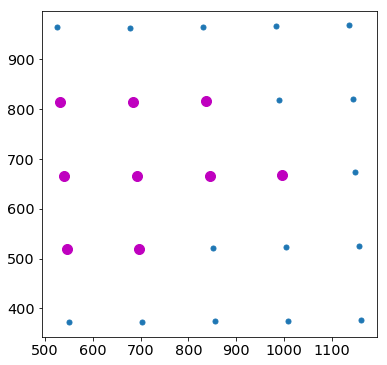

In [118]:
print selected_centers_high
plt.figure(figsize=(6,6))
plt.plot(order0_positions.T[0],order0_positions.T[1],'o',label='star centroids',markersize=5)
plt.plot(selected_centers_loose.T[0],selected_centers_loose.T[1],'mo',label='order +1 spectra with FWHM<%.1f' % threshold_loose,markersize=10)
plt.plot(selected_centers_high.T[0],selected_centers_high.T[1],'ro',label='order +1 spectra with FWHM<%.1f' % threshold_high,markersize=15)
plt.plot(1090,653,'gx',markersize=20,label='rotation center with Hessian')
plt.xlim(0,2048)
plt.ylim(0,2048)
plt.xlabel('Pixel x')
plt.ylabel('Pixel y')
plt.text(1300,1250,holo_name,fontsize=18)
plt.legend()
plt.grid(True)

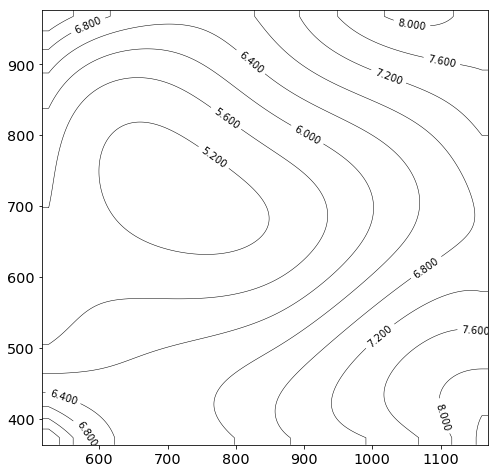

In [230]:
min_fwhms = []
for i in range(5):
    for j in range(5):
        profile = theprofiles[5*i + j %5]
        min_fwhm = 1e20
        for k,f in enumerate(profile[1]) :
            if profile[0][k]>right_part and profile[0][k]<right_edge : 
                if min_fwhm > profile[1][k] :
                    min_fwhm = profile[1][k]
        min_fwhms.append(min_fwhm)

margin = 10
positions = (order0_positions.T[:2]).T
x, y = positions.T
xx,yy,z,interp = scatter_interpol(positions,min_fwhms,margin=margin)

fig = plt.figure(figsize=(8,8))
CS = plt.contour(xx,yy,z,10,linewidths=0.5,colors='k')
plt.clabel(CS, inline=1, fontsize=10)
plt.show()

-----------------------------
Load hologram HoloAmAg:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -1.9 degrees
Hologram center at x0 = 1070.9 and y0 = 586.1 with average tilt of -1.9 degrees
Order  0 position at x0 = 805.1 and y0 = 595.0
Order +1 position at x0 = 1336.6 and y0 = 577.3
Distance between the orders: 531.79 pixels (12.76 mm)
-----------------------------
Use imported N() function to compute order0 and order1 positions:
Order  0 position at x0 = 800.4 and y0 = 639.7
Order +1 position at x0 = 1331.3 and y0 = 626.1
Distance between the orders: 531.06 pixels (12.75 mm)


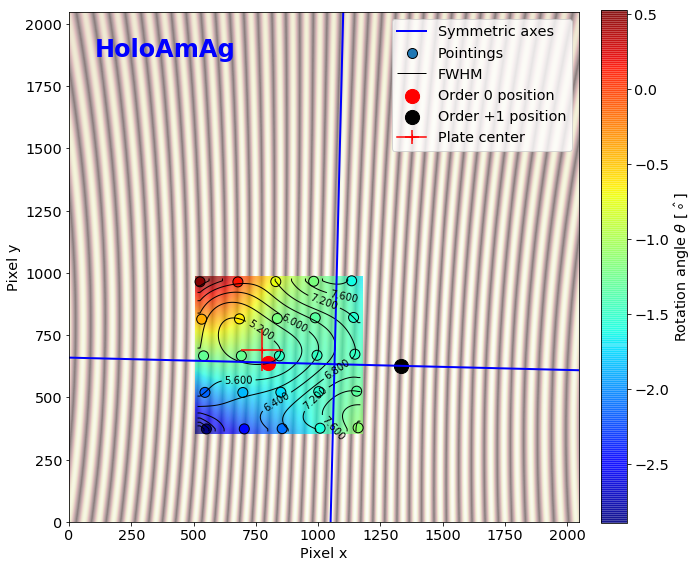

In [127]:
from holo_specs import *
print '-----------------------------'
H = Hologram(holo_name)
print '-----------------------------'
print 'Use imported N() function to compute order0 and order1 positions:'
xs, line1, line2 = neutral_lines(x_center,y_center,theta_tilt)
order0_position, order1_position, AB = find_order01_positions([x_center,y_center],H.N,theta_interp)

fig=plt.figure(figsize=(10,10))
# Background hologram shape
plt.imshow(H.hologram_shape,origin='lower', alpha=0.5, cmap=cm.pink)
# Pointings with rotation angle
x, y = np.array(order0_positions).T
plt.scatter(x, y, c=all_theta, label='Pointings',s=100, cmap=cm.jet, marker='o',vmin=np.min(all_theta), vmax=np.max(all_theta),edgecolors='k')
im = plt.imshow(theta_z, alpha=0.7,extent=[np.min(theta_xx)-margin, np.max(theta_xx)+margin, np.min(theta_yy)-margin, np.max(theta_yy)+margin],origin='lower',aspect='auto',cmap=cm.jet)
# Hologram resolution
CS = plt.contour(xx,yy,z,10,linewidths=1,colors='k',label='Minimum spectrum FWHM value')
plt.clabel(CS, inline=1, fontsize=10)
labels = ['FWHM']
for i in range(len(labels)):
    CS.collections[i].set_label(labels[i])
# Hologram geometry
plt.plot(xs,line1,'b-',label='Symmetric axes',lw=2)
plt.plot(xs,line2,'b-',lw=2)
plt.scatter(order0_position[0],order0_position[1],s=200,facecolor='red',label='Order 0 position')
plt.scatter(order1_position[0],order1_position[1],s=200,facecolor='black',label='Order +1 position')
plt.errorbar(0.5*IMSIZE+PLATE_CENTER_SHIFT_X/PIXEL2MM,0.5*IMSIZE+PLATE_CENTER_SHIFT_Y/PIXEL2MM,xerr=PLATE_CENTER_SHIFT_X_ERR/PIXEL2MM,yerr=PLATE_CENTER_SHIFT_Y_ERR/PIXEL2MM,marker='+',color='red',label='Plate center')
# Axis and colobar settings
plt.xlabel('Pixel x')
plt.ylabel('Pixel y')
plt.annotate(holo_name,xy=(0.05,0.95),xytext=(0.05,0.95),fontsize=24,verticalalignment='top',
                  fontweight='bold',color='blue',horizontalalignment='left',xycoords='axes fraction')
plt.xlim([0,IMSIZE])
plt.ylim([0,IMSIZE])
plt.gca().set_aspect('equal', adjustable='box')
#divider = make_axes_locatable(ax)
#cax = divider.append_axes("right", size="5%", pad=0.05)
cb = fig.colorbar(im,fraction=0.046, pad=0.04)#, cax=cbar_ax)
cb.formatter.set_powerlimits((0, 0))
cb.update_ticks()
cb.set_label('Rotation angle $\\theta$ [$\^\circ$]') #,fontsize=16)
plt.legend()
figfilename=os.path.join(dir_top_images,'%s_geometry.pdf' % holo_name)
plt.savefig(figfilename, bbox_inches='tight', rasterized=True, dpi=300)  
plt.show()

## Save grating FWHMs

In [55]:
dirname = "../../common_tools/data/"+holo_name
ensure_dir(dirname)
print 'Save results in ',dirname
print '--------------------------------------------------------------'
#textfilename=os.path.join(dirname,'hologram_rotation_angles.txt')
#print textfilename
#out = []
#for index in range(len(all_theta)):
#    out.append([order0_positions[index][0], order0_positions[index][1], all_theta[index]])
#np.savetxt(textfilename,np.array(out),header="x_star y_star theta_in_degree",fmt='%.3f')

textfilename=os.path.join(dirname,'hologram_min_fwhm.txt')
print textfilename
out = []
for index in range(len(all_theta)):
    out.append([order0_positions[index][0], order0_positions[index][1], min_fwhms[index]])
np.savetxt(textfilename,np.array(out),header="x_star y_star min_fwhm",fmt='%.3f')

#text = "#x_center y_center theta_tilt_in_degree\n" 
#text += "%.3f %.3f %.3f\n" % (x_center, y_center, theta_tilt)
#textfilename = dirname+"/hologram_center.txt"
#print textfilename
#f=open(textfilename,'w')
#f.write(text)
#f.close()

With distance to CCD = 55.45 +/- 0.19 mm
Average grooves per mm : 300.00 +/- 0.99 /mm (0.33 percent)


## Save spectra

In [56]:
newfullfilenames=[]
for idx,file in np.ndenumerate(sorted_files):
    short_infilename=file.split("/")[2]
    short_partfilename=re.findall('^rotimg_(.*)',short_infilename)
    short_outfilename='finalSpectra_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

for idx,file in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=thecorrspectra[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(file,clobber=True)
    
!ls -l spectrum_fitsspec

total 1600
-rw-r--r--  1 jneveu  staff  28800  9 aoû 16:32 finalSpectra_20170609_183.fits
-rw-r--r--  1 jneveu  staff  28800  9 aoû 16:32 finalSpectra_20170609_184.fits
-rw-r--r--  1 jneveu  staff  28800  9 aoû 16:32 finalSpectra_20170609_185.fits
-rw-r--r--  1 jneveu  staff  28800  9 aoû 16:32 finalSpectra_20170609_186.fits
-rw-r--r--  1 jneveu  staff  28800  9 aoû 16:32 finalSpectra_20170609_187.fits
-rw-r--r--  1 jneveu  staff  28800  9 aoû 16:32 finalSpectra_20170609_188.fits
-rw-r--r--  1 jneveu  staff  28800  9 aoû 16:32 finalSpectra_20170609_189.fits
-rw-r--r--  1 jneveu  staff  28800  9 aoû 16:32 finalSpectra_20170609_190.fits
-rw-r--r--  1 jneveu  staff  28800  9 aoû 16:32 finalSpectra_20170609_191.fits
-rw-r--r--  1 jneveu  staff  28800  9 aoû 16:32 finalSpectra_20170609_192.fits
-rw-r--r--  1 jneveu  staff  28800  9 aoû 16:32 finalSpectra_20170609_193.fits
-rw-r--r--  1 jneveu  staff  28800  9 aoû 16:32 finalSpectra_20170609_194.fits
-rw-r--r--  1 jneveu  staff  28800  9 aoû